<a href="https://colab.research.google.com/github/falseywinchnet/PicoGPT/blob/main/RAINSTARMLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Using device: cuda

--- Processing Spiral ---


/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1617: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  _C._set_float32_matmul_precision(precision)
/tmp/ipython-input-3826104779.py:245: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
/tmp/ipython-input-3826104779.py:263: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Plea

      Vanilla MLP (GELU) | steps: 246 | final loss: 0.6090 | 4.2s
                  My MLP | steps: 300 | final loss: 0.0011 | 5.6s


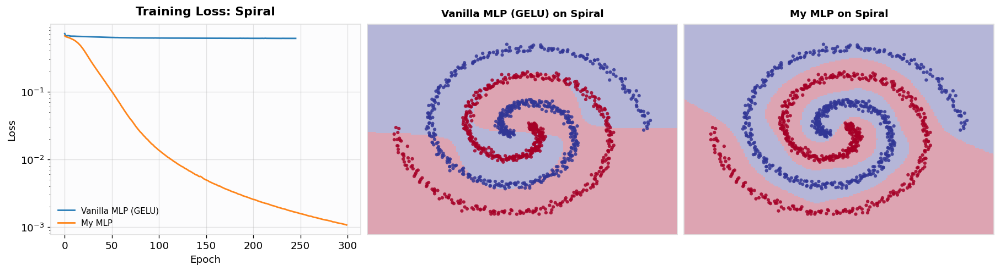

Saved: plots_fast/spiral.png

--- Processing Checkerboard (4x4) ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.3940 | 5.8s
                  My MLP | steps: 300 | final loss: 0.0810 | 5.8s


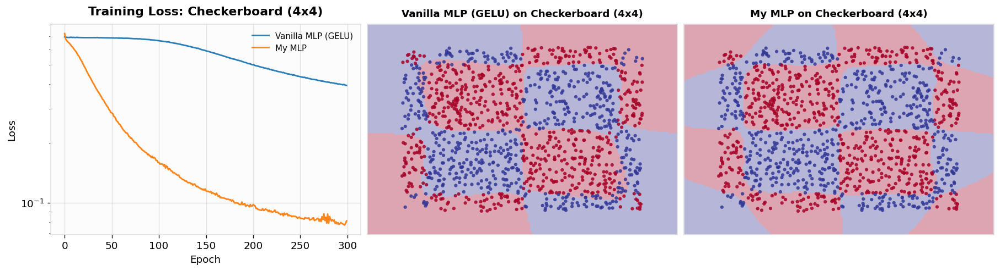

Saved: plots_fast/checkerboard_4x4.png

--- Processing Concentric Rings ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.4087 | 5.4s
                  My MLP | steps: 300 | final loss: 0.0218 | 5.7s


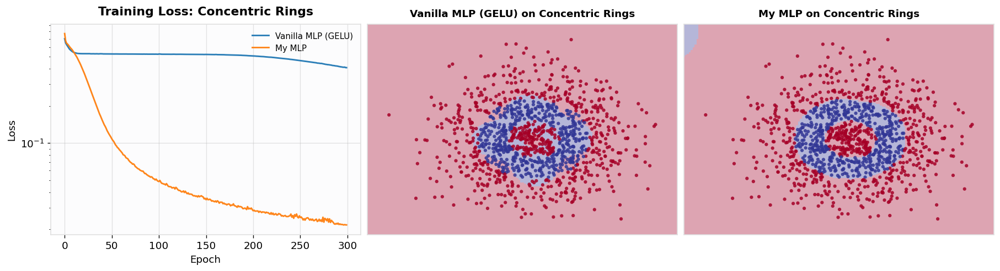

Saved: plots_fast/concentric_rings.png

--- Processing Periodic Wells ---
      Vanilla MLP (GELU) | steps:  87 | final loss: 0.6042 | 1.9s
                  My MLP | steps: 300 | final loss: 0.0745 | 5.3s


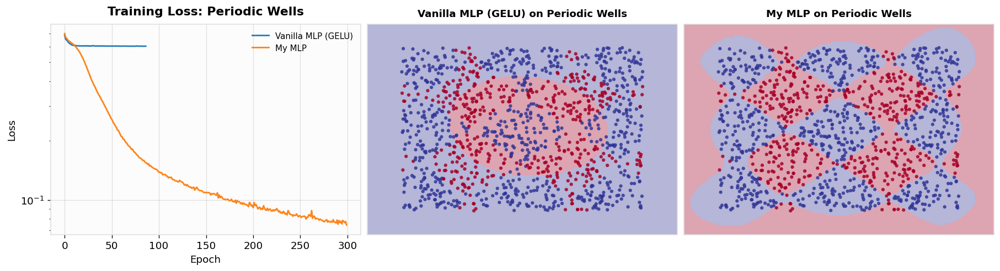

Saved: plots_fast/periodic_wells.png

--- Processing Two Moons ---
      Vanilla MLP (GELU) | steps: 209 | final loss: 0.0006 | 4.2s
                  My MLP | steps: 109 | final loss: 0.0001 | 2.0s


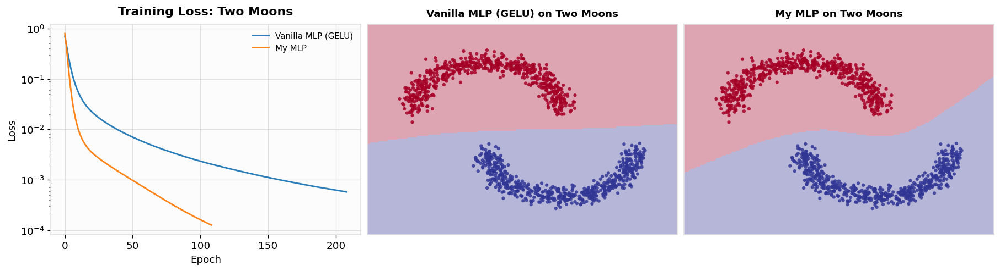

Saved: plots_fast/two_moons.png

--- Processing Pinwheel ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.0034 | 4.9s
                  My MLP | steps: 131 | final loss: 0.0004 | 3.2s


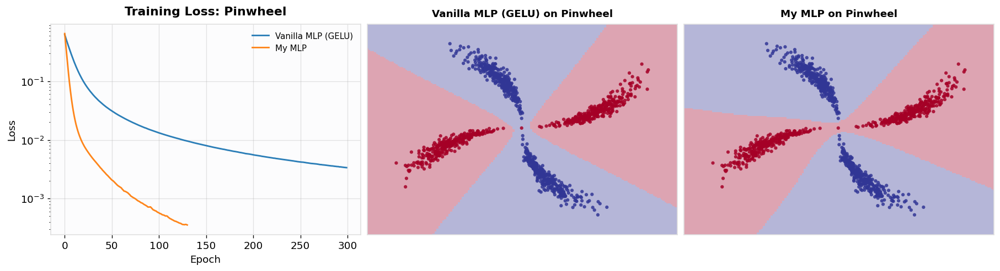

Saved: plots_fast/pinwheel.png

--- Processing XOR Quadrants ---
      Vanilla MLP (GELU) | steps: 144 | final loss: 0.2195 | 2.4s
                  My MLP | steps: 115 | final loss: 0.2113 | 2.3s


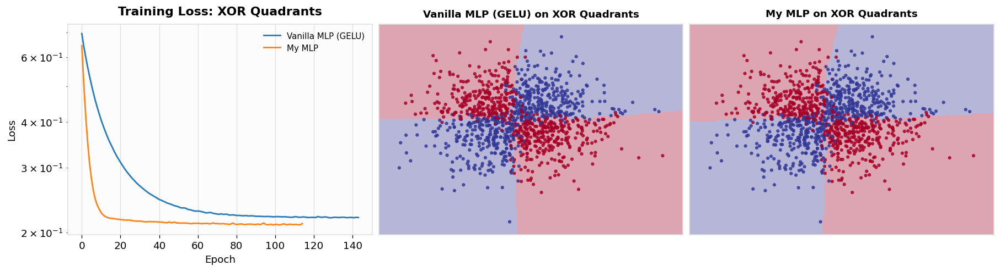

Saved: plots_fast/xor_quadrants.png

--- Processing Sinusoid Boundary ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.1324 | 5.9s
                  My MLP | steps: 300 | final loss: 0.0178 | 5.8s


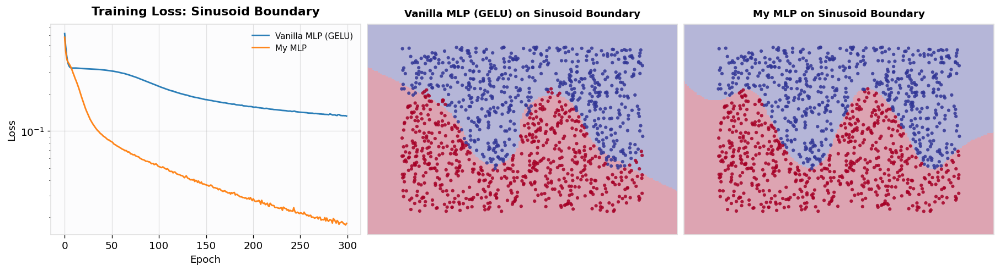

Saved: plots_fast/sinusoid_boundary.png

--- Processing Radial Stripes ---
      Vanilla MLP (GELU) | steps:  30 | final loss: 0.6925 | 0.5s
                  My MLP | steps:  37 | final loss: 0.6904 | 0.7s


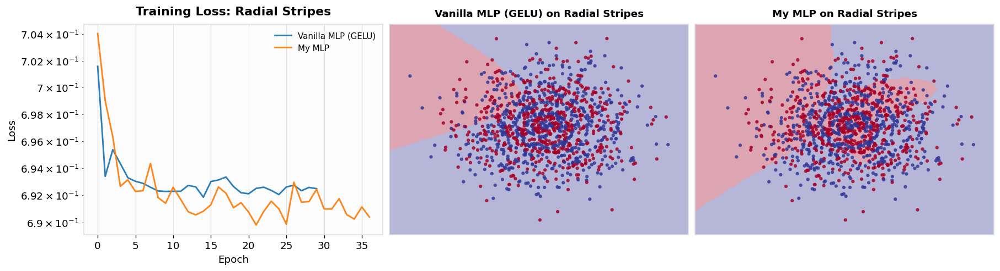

Saved: plots_fast/radial_stripes.png

--- Processing Swiss Cheese (holes) ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.2686 | 4.9s
                  My MLP | steps: 300 | final loss: 0.0349 | 4.2s


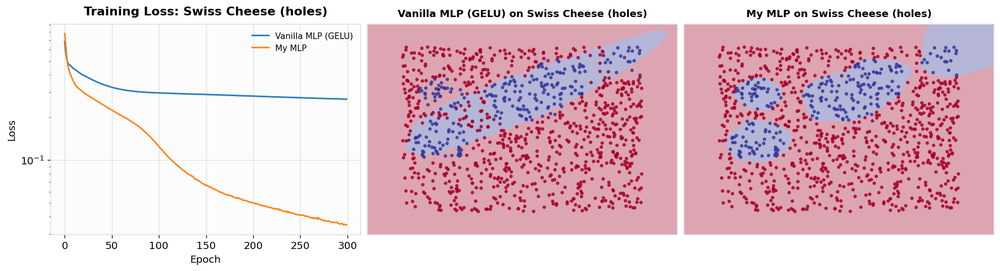

Saved: plots_fast/swiss_cheese_holes.png

--- Processing Lissajous Boundary ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.0870 | 6.3s
                  My MLP | steps: 300 | final loss: 0.0195 | 5.4s


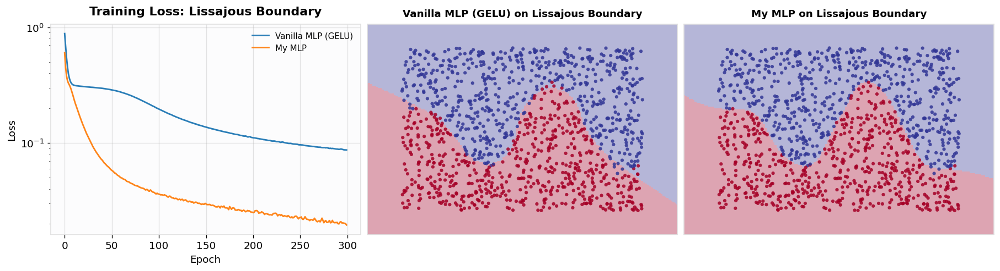

Saved: plots_fast/lissajous_boundary.png

--- Processing Lorenz Lobes ---
      Vanilla MLP (GELU) | steps: 300 | final loss: 0.0098 | 5.7s
                  My MLP | steps: 257 | final loss: 0.0019 | 5.0s


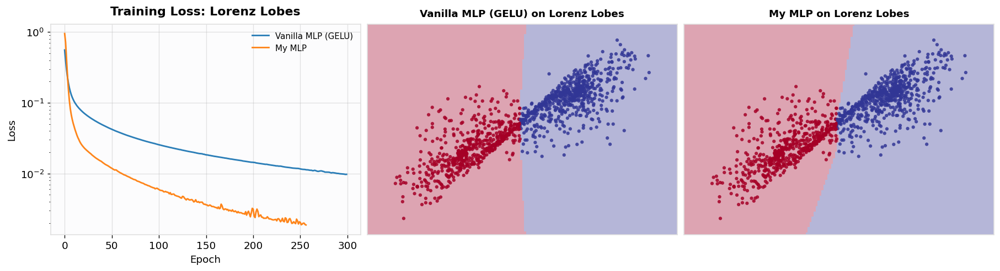

Saved: plots_fast/lorenz_lobes.png


In [2]:
#please credit joshuah rainstar if you use this custom MLP design, this activation function,
#the use of a LN or this nonlinearity between the layers, or just for any reason!
#joshuah.rainstar@gmail.com 2025

import os
import math
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

# =========================
# 0. Reproducibility & Device
# =========================
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

# Prefer speed since we're time-bounded
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark = True
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass

if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

# =========================
# 1. Model Definitions (unchanged semantics)
# =========================
class VanillaMLP(nn.Module):
    """
    Standard MLP: Linear -> GELU -> Linear
    Output dim == input dim (2) -> logits for binary classes
    """
    def __init__(self, input_dim, hidden_dim):
        super().__init__()
        self.c_fc = nn.Linear(input_dim, hidden_dim, bias=True)
        self.act = nn.GELU()
        self.c_proj = nn.Linear(hidden_dim, input_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        return x

class CustomMLP(nn.Module):
    """
    Linear -> polynomial -> LayerNorm -> gated sigmoid -> Linear
    Output dim == input dim (2) -> logits for binary classes
    """
    def __init__(self, input_dim, hidden_dim):
        super().__init__()
        self.c_fc    = nn.Linear(input_dim, hidden_dim, bias=True)
        self.scale   = math.pi / math.sqrt(3.0)
        self.ln      = nn.LayerNorm(hidden_dim)
        self.c_proj  = nn.Linear(hidden_dim, input_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = x**2 + 0.5*x**3
        x = self.ln(x)
        x = x * torch.sigmoid(self.scale * x)
        x = self.c_proj(x)
        return x

# =========================
# 2. Dataset Generators
# =========================
def _standardize(X):
    X = (X - X.mean(axis=0, keepdims=True)) / (X.std(axis=0, keepdims=True) + 1e-8)
    return X

def make_spiral(n_samples=1200, noise=0.12):
    n = n_samples // 2
    def gen_spiral(delta_t, label):
        r = torch.linspace(1, 12, n)
        t = torch.linspace(1, 3.5 * math.pi, n) + delta_t
        x = r * torch.sin(t)
        y = r * torch.cos(t)
        data = torch.stack([x, y], dim=1)
        data = data + torch.randn_like(data) * noise * 2.0
        labels = torch.full((n,), label)
        return data, labels
    d1, l1 = gen_spiral(0.0, 0)
    d2, l2 = gen_spiral(math.pi, 1)
    X = torch.cat([d1, d2])
    y = torch.cat([l1, l2]).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_checkerboard(n_samples=1200, frequency=4):
    X = torch.rand(n_samples, 2) * 2 * frequency - frequency
    y_vals = torch.sin(X[:, 0]) * torch.sin(X[:, 1])
    y = (y_vals > 0).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_rings(n_samples=1200):
    X = torch.randn(n_samples, 2)
    radius = torch.norm(X, dim=1)
    y = ((radius > 0.6) & (radius < 1.3)).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_periodic_wells(n_samples=1200, k=3, extent=2.5):
    X = (torch.rand(n_samples, 2) * 2 * extent - extent)
    U = torch.cos(k * X[:, 0]) + torch.cos(k * X[:, 1])
    y = (U > 0).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_two_moons(n_samples=1200, noise=0.1, distance=0.8):
    n = n_samples // 2
    t = torch.linspace(0, math.pi, n)
    x1 = torch.stack([torch.cos(t), torch.sin(t)], dim=1)
    x2 = torch.stack([1 - torch.cos(t), -torch.sin(t) - distance], dim=1)
    X = torch.cat([x1, x2], dim=0) + noise * torch.randn(n_samples, 2)
    y = torch.cat([torch.zeros(n), torch.ones(n)]).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_pinwheel(n_samples=1200, radial_std=0.32, tangential_std=0.06, num_arms=4, rate=0.30):
    num_per_arm = n_samples // num_arms
    feats, labs = [], []
    for a in range(num_arms):
        rads = torch.randn(num_per_arm) * radial_std + 1.0
        angs = torch.randn(num_per_arm) * tangential_std + a * (2 * math.pi / num_arms) + rate * rads
        xs = rads * torch.cos(angs)
        ys = rads * torch.sin(angs)
        feats.append(torch.stack([xs, ys], dim=1))
        labs.append(torch.full((num_per_arm,), a % 2))
    X = torch.cat(feats, dim=0)
    y = torch.cat(labs, dim=0).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_xor_quadrants(n_samples=1200, margin_noise=0.15):
    X = torch.randn(n_samples, 2)
    y = (X[:, 0] * X[:, 1] > 0).long()
    X += margin_noise * torch.randn_like(X)
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_sinusoid_boundary(n_samples=1200, freq=3.0, amp=1.0):
    x = torch.rand(n_samples) * 4 - 2
    yv = torch.rand(n_samples) * 4 - 2
    y = (yv > amp * torch.sin(freq * x)).long()
    X = torch.stack([x, yv], dim=1)
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_radial_stripes(n_samples=1200, n_stripes=6):
    X = torch.randn(n_samples, 2)
    r = torch.norm(X, dim=1)
    y = (torch.floor(r * n_stripes) % 2 == 0).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_swiss_cheese(n_samples=1000, n_holes=6, extent=2.4, hole_r=(0.35, 0.7)):
    X = torch.rand(n_samples, 2) * 2 * extent - extent
    centers = torch.rand(n_holes, 2) * 2 * extent - extent
    radii = torch.rand(n_holes) * (hole_r[1] - hole_r[0]) + hole_r[0]
    y = torch.zeros(n_samples, dtype=torch.long)
    for c, r in zip(centers, radii):
        d = torch.norm(X - c, dim=1)
        y |= (d < r).long()
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_lissajous_boundary(n_samples=1200, a=3, b=2, amp=0.8):
    x = torch.rand(n_samples) * 4 - 2
    yv = torch.rand(n_samples) * 4 - 2
    boundary = amp * (torch.sin(a * x) + 0.5 * torch.sin(b * x + math.pi/4))
    y = (yv > boundary).long()
    X = torch.stack([x, yv], dim=1)
    X = _standardize(X.numpy())
    return torch.from_numpy(X).float(), y

def make_lorenz_lobes(n_samples=1200, dt=0.01, warmup=800, total_steps=40000,
                      sigma=10.0, rho=28.0, beta=8/3, noise=0.02):
    # Light-weight simulation
    x, y, z = 0.1, 0.0, 0.0
    xs, ys = [], []
    for i in range(total_steps):
        dx = sigma * (y - x)
        dy = x * (rho - z) - y
        dz = x * y - beta * z
        x += dx * dt; y += dy * dt; z += dz * dt
        if i >= warmup:
            xs.append(x); ys.append(y)
    xs = np.asarray(xs); ys = np.asarray(ys)
    idx = np.linspace(0, len(xs) - 1, n_samples).astype(int)
    X = np.stack([xs[idx], ys[idx]], axis=1)
    X += noise * np.random.randn(*X.shape)
    y = (X[:, 0] > 0).astype(np.int64)
    X = _standardize(X)
    return torch.from_numpy(X).float(), torch.from_numpy(y)

# =========================
# 3. DataLoader helper
# =========================
def make_loader(X, y, batch_size=512, shuffle=True):
    ds = TensorDataset(X, y)
    num_workers = min(4, os.cpu_count() or 1)
    return DataLoader(
        ds,
        batch_size=batch_size,
        shuffle=shuffle,
        drop_last=False,
        pin_memory=(device.type == "cuda"),
        num_workers=num_workers,
        persistent_workers=(num_workers > 0)
    )

# =========================
# 4. Training utilities (time-bounded + early stop)
# =========================
def train_model(
    model,
    loader,
    epochs=300,
    lr=2e-3,
    device=device,
    use_amp=True,
    time_budget_s=30.0,
    plateau_patience=20,
    plateau_tol=1e-4,
):
    model = model.to(device)  # IMPORTANT
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))

    best_loss = float("inf")
    bad_epochs = 0
    losses = []
    start_time = time.time()

    model.train()
    for ep in range(epochs):
        total_loss = 0.0
        seen = 0
        for xb, yb in loader:
            if time.time() - start_time > time_budget_s:
                break
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)
            if device.type == "cuda" and use_amp:
                with torch.cuda.amp.autocast():
                    logits = model(xb)
                    loss = criterion(logits, yb)
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                logits = model(xb)
                loss = criterion(logits, yb)
                loss.backward()
                optimizer.step()
            total_loss += loss.detach().item() * xb.size(0)
            seen += xb.size(0)

        # If nothing processed (time budget expired before first batch)
        if seen == 0:
            break

        avg_loss = total_loss / seen
        losses.append(avg_loss)

        # Early stop on plateau
        if avg_loss + plateau_tol < best_loss:
            best_loss = avg_loss
            bad_epochs = 0
        else:
            bad_epochs += 1
            if bad_epochs >= plateau_patience:
                # print(f"Early stop at epoch {ep+1}: plateau")
                break

        # Global time budget check
        if time.time() - start_time > time_budget_s:
            # print("Stopping due to time budget")
            break

    model.eval()
    return losses, model

def decision_boundary(ax, model, X, y, title="", grid_res=160, batch=32768, alpha=0.35):
    # Bounds
    X_cpu = X.cpu().numpy()
    x_min, x_max = X_cpu[:, 0].min() - 0.5, X_cpu[:, 0].max() + 0.5
    y_min, y_max = X_cpu[:, 1].min() - 0.5, X_cpu[:, 1].max() + 0.5

    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, grid_res),
        np.linspace(y_min, y_max, grid_res)
    )
    grid = np.c_[xx.ravel(), yy.ravel()].astype(np.float32)
    preds = np.empty((grid.shape[0],), dtype=np.int64)

    with torch.no_grad():
        for i in range(0, grid.shape[0], batch):
            chunk = torch.from_numpy(grid[i:i+batch]).to(device, non_blocking=True)
            logits = model(chunk)
            preds[i:i+batch] = torch.argmax(logits, dim=1).detach().cpu().numpy()

    preds = preds.reshape(xx.shape)

    ax.pcolormesh(xx, yy, preds, shading="auto", alpha=alpha, cmap=plt.cm.RdYlBu)
    ax.scatter(
        X_cpu[:, 0], X_cpu[:, 1],
        c=y.cpu().numpy(), s=14, cmap=plt.cm.RdYlBu,
        edgecolors="none", alpha=0.85
    )
    ax.set_title(title, pad=8, fontsize=11)
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_xlim(x_min, x_max); ax.set_ylim(y_min, y_max)

def pretty_style():
    plt.rcParams.update({
        "figure.figsize": (12, 4),
        "figure.dpi": 120,
        "axes.facecolor": "#fcfcfd",
        "figure.facecolor": "#ffffff",
        "axes.grid": True,
        "grid.alpha": 0.25,
        "axes.titleweight": "semibold",
        "axes.titlepad": 10,
        "axes.edgecolor": "#e0e0e0",
        "axes.linewidth": 1.0,
        "font.size": 11,
        "legend.frameon": False,
        "legend.fontsize": 9,
        "savefig.bbox": "tight",
    })

# =========================
# 5. Datasets registry (kept broad, but light)
# =========================
def build_datasets():
    return {
        "Spiral": make_spiral(1200, noise=0.12),
        "Checkerboard (4x4)": make_checkerboard(1200, frequency=4),
        "Concentric Rings": make_rings(1200),

        "Periodic Wells": make_periodic_wells(1200, k=3, extent=2.5),
        "Two Moons": make_two_moons(1200, noise=0.10, distance=0.8),
        "Pinwheel": make_pinwheel(1200, radial_std=0.32, tangential_std=0.06, num_arms=4, rate=0.30),
        "XOR Quadrants": make_xor_quadrants(1200, margin_noise=0.15),
        "Sinusoid Boundary": make_sinusoid_boundary(1200, freq=3.0, amp=1.0),
        "Radial Stripes": make_radial_stripes(1200, n_stripes=6),
        "Swiss Cheese (holes)": make_swiss_cheese(1000, n_holes=6, extent=2.4, hole_r=(0.35, 0.7)),
        "Lissajous Boundary": make_lissajous_boundary(1200, a=3, b=2, amp=0.8),
        "Lorenz Lobes": make_lorenz_lobes(n_samples=1200, dt=0.01, warmup=800, total_steps=40000),
    }

# =========================
# 6. Main harness (time budgets tuned for T4)
# =========================
def run_harness(
    hidden_dim=192,   # slightly smaller for speed
    lr=2e-3,
    epochs=300,
    batch_size=512,
    use_amp=True,
    out_dir="plots_fast",
    time_budget_s_per_model=30.0,  # hard cap per model per dataset
    plateau_patience=15,
    plateau_tol=1e-4,
    grid_res=160
):
    os.makedirs(out_dir, exist_ok=True)
    pretty_style()
    datasets = build_datasets()

    for ds_name, (X, y) in datasets.items():
        print(f"\n--- Processing {ds_name} ---")
        loader = make_loader(X, y, batch_size=batch_size, shuffle=True)

        models = {
            "Vanilla MLP (GELU)": VanillaMLP(input_dim=2, hidden_dim=hidden_dim),
            "My MLP": CustomMLP(input_dim=2, hidden_dim=hidden_dim),
        }

        loss_histories = {}
        trained_models = {}

        # Train both models with strict time caps
        for name, model in models.items():
            start = time.time()
            losses, trained = train_model(
                model,
                loader,
                epochs=epochs,
                lr=lr,
                device=device,
                use_amp=use_amp,
                time_budget_s=time_budget_s_per_model,
                plateau_patience=plateau_patience,
                plateau_tol=plateau_tol,
            )
            loss_histories[name] = losses
            trained_models[name] = trained
            dur = time.time() - start
            final_loss = losses[-1] if len(losses) else float("nan")
            print(f"  {name:>22s} | steps: {len(losses):3d} | final loss: {final_loss:.4f} | {dur:.1f}s")

        # Plot: one figure per dataset (loss + 2 boundaries)
        fig, axes = plt.subplots(1, 3, figsize=(15, 4), constrained_layout=True)

        # Loss
        ax0 = axes[0]
        for name, losses in loss_histories.items():
            ax0.plot(losses, label=name, linewidth=1.7, alpha=0.95)
        ax0.set_title(f"Training Loss: {ds_name}")
        ax0.set_xlabel("Epoch")
        ax0.set_ylabel("Loss")
        if all(len(v) > 0 for v in loss_histories.values()):
            ax0.set_yscale("log")
        ax0.grid(True, alpha=0.35)
        ax0.legend()

        # Decision boundaries (evaluate in chunks, smaller grid)
        decision_boundary(
            axes[1],
            trained_models["Vanilla MLP (GELU)"],
            X, y,
            title=f"Vanilla MLP (GELU) on {ds_name}",
            grid_res=grid_res
        )
        decision_boundary(
            axes[2],
            trained_models["My MLP"],
            X, y,
            title=f"My MLP on {ds_name}",
            grid_res=grid_res
        )

        # Save & Show
        safe_name = (
            ds_name.lower().replace(' ', '_')
            .replace('(', '').replace(')', '').replace('/', '_')
        )
        out_path = os.path.join(out_dir, f"{safe_name}.png")
        plt.savefig(out_path, dpi=160)
        plt.show()
        print(f"Saved: {out_path}")

# =========================
# 7. Execute
# =========================
if __name__ == "__main__":
    run_harness(
        hidden_dim=192,
        lr=2e-3,
        epochs=300,
        batch_size=512,
        use_amp=True,
        out_dir="plots_fast",
        time_budget_s_per_model=30.0,  # tweak to tighten/loosen runtime
        plateau_patience=15,
        plateau_tol=1e-4,
        grid_res=160
    )


Using device: cuda

=== Problem: Franke ===


/tmp/ipython-input-3222338435.py:266: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
/tmp/ipython-input-3222338435.py:276: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


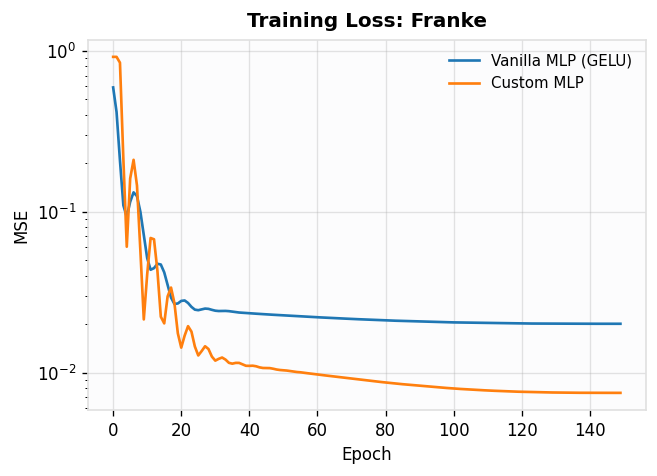

Saved: field_plots_fast/franke_loss.png


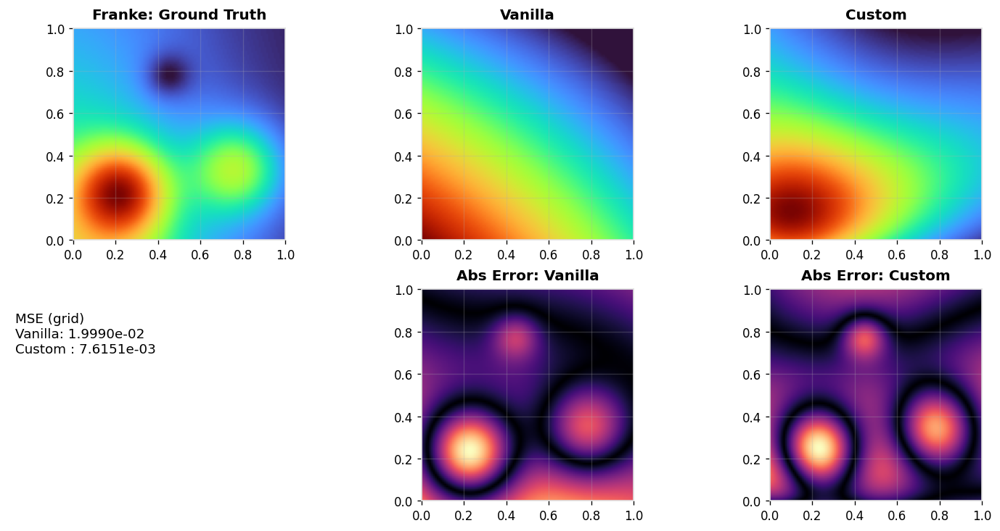

Saved: field_plots_fast/franke_scalar.png

=== Problem: Peaks ===


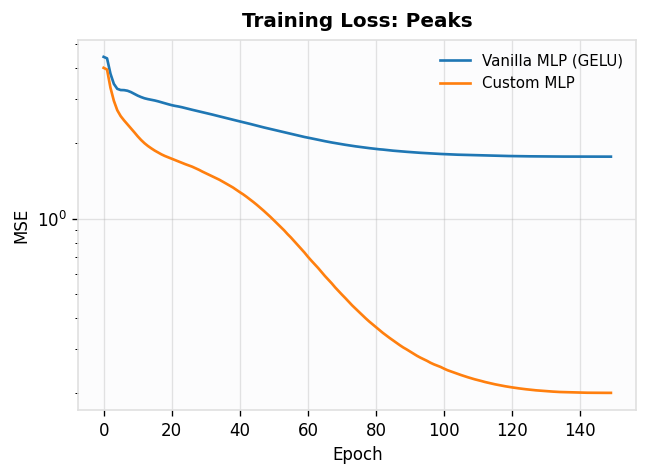

Saved: field_plots_fast/peaks_loss.png


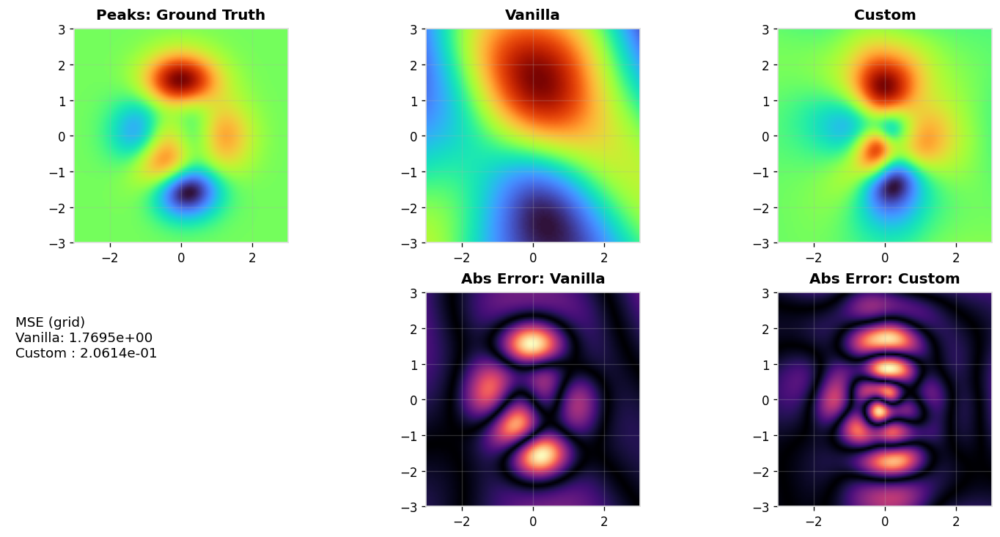

Saved: field_plots_fast/peaks_scalar.png

=== Problem: Periodic Wells (scalar) ===


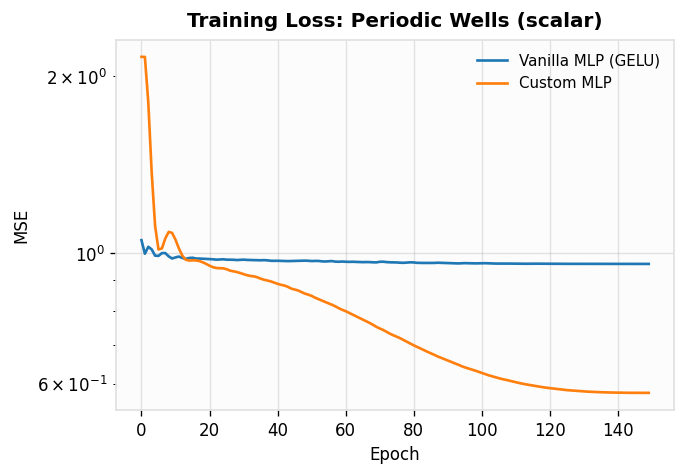

Saved: field_plots_fast/periodic_wells_(scalar)_loss.png


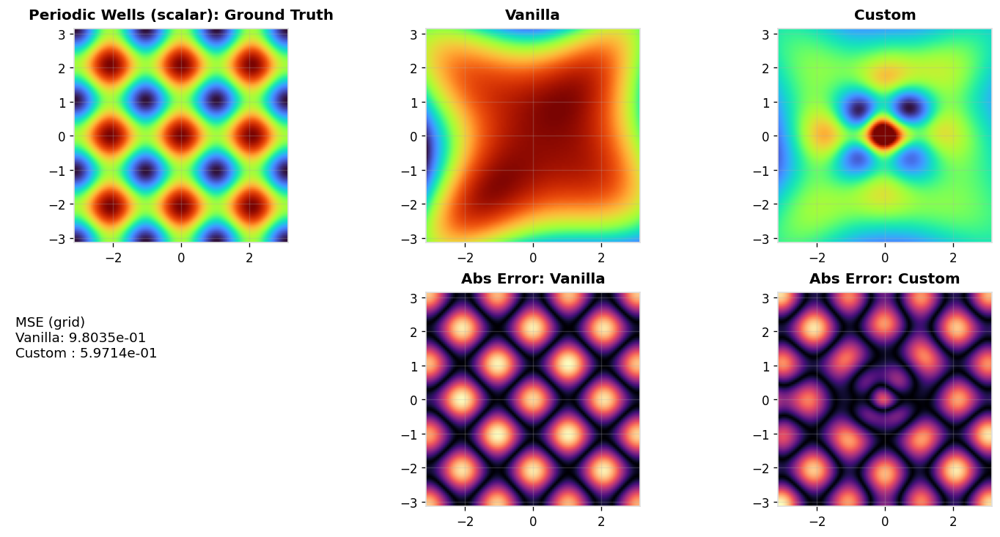

Saved: field_plots_fast/periodic_wells_(scalar)_scalar.png

=== Problem: Ripple ===


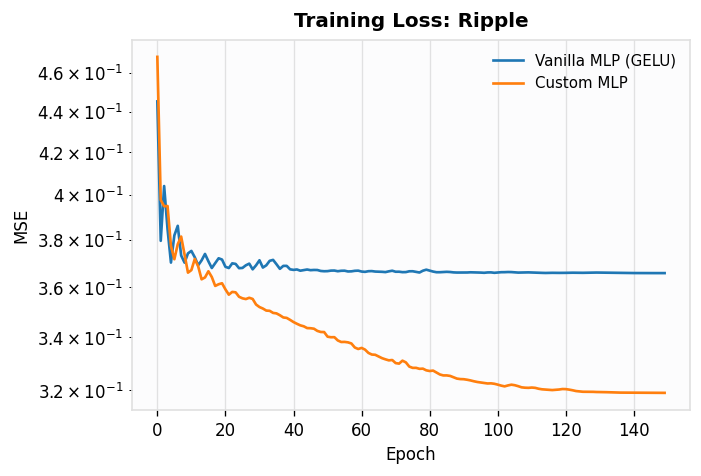

Saved: field_plots_fast/ripple_loss.png


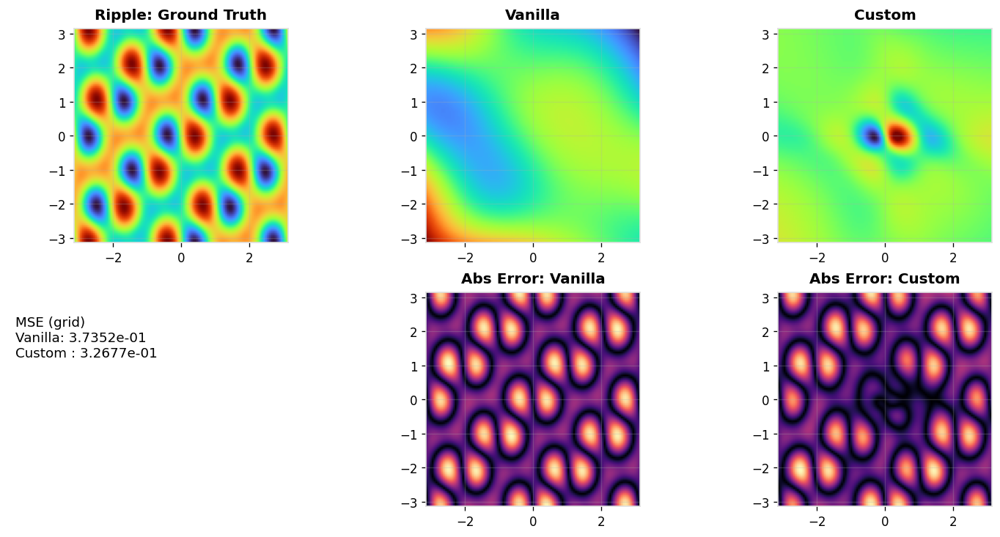

Saved: field_plots_fast/ripple_scalar.png

=== Problem: Ring SDF ===


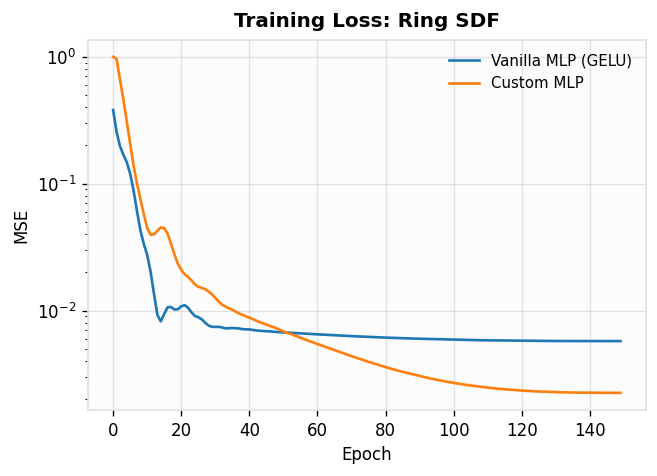

Saved: field_plots_fast/ring_sdf_loss.png


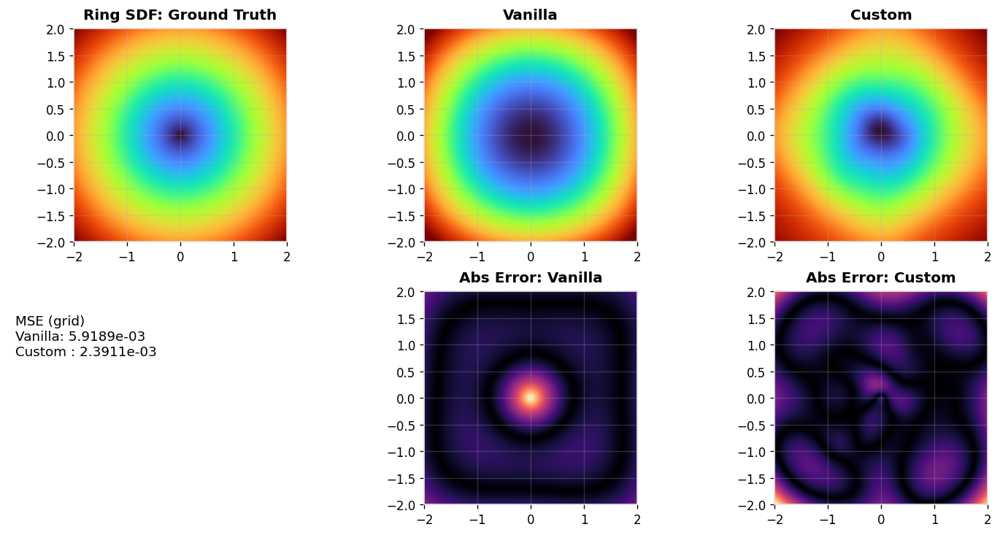

Saved: field_plots_fast/ring_sdf_scalar.png

=== Problem: RGB Swirls ===


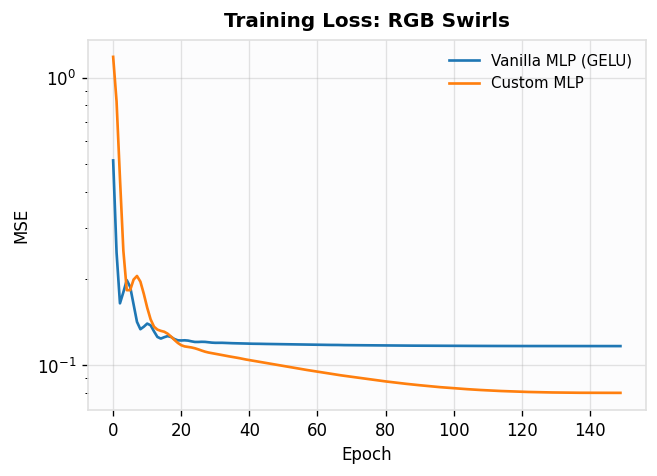

Saved: field_plots_fast/rgb_swirls_loss.png


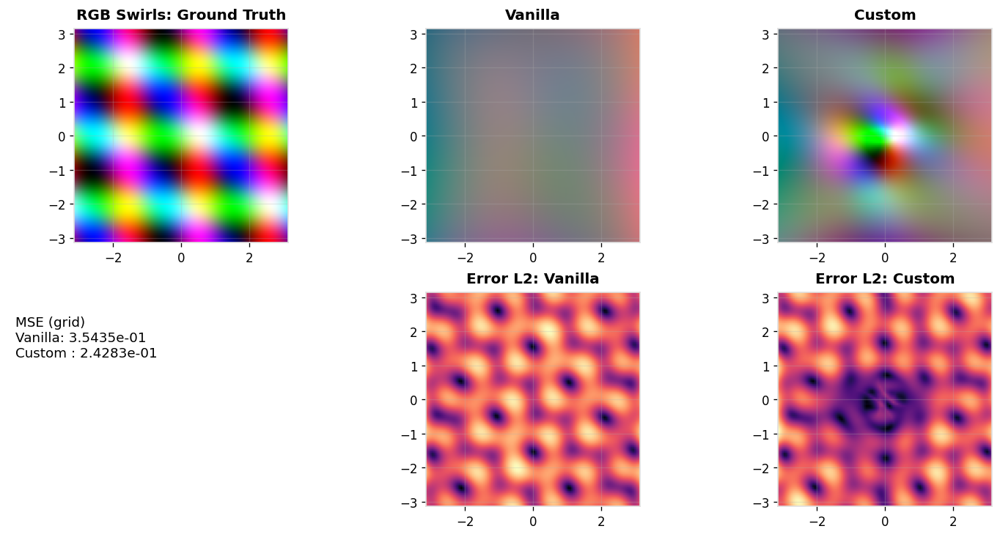

Saved: field_plots_fast/rgb_swirls_rgb.png

=== Problem: RGB Polar ===


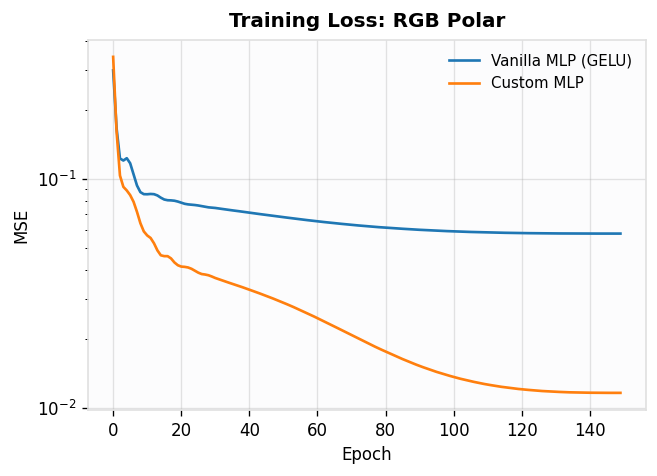

Saved: field_plots_fast/rgb_polar_loss.png


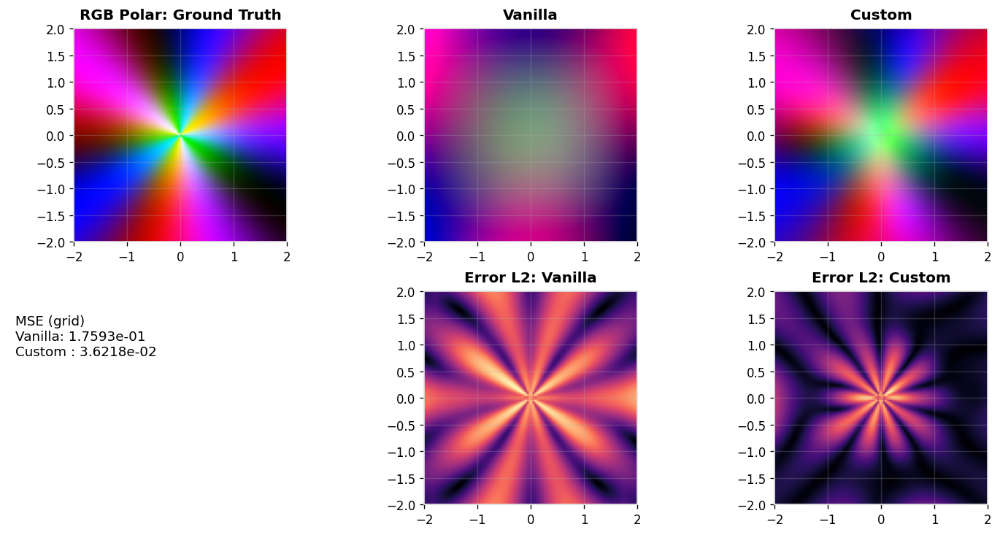

Saved: field_plots_fast/rgb_polar_rgb.png

=== Problem: RGB Checker ===


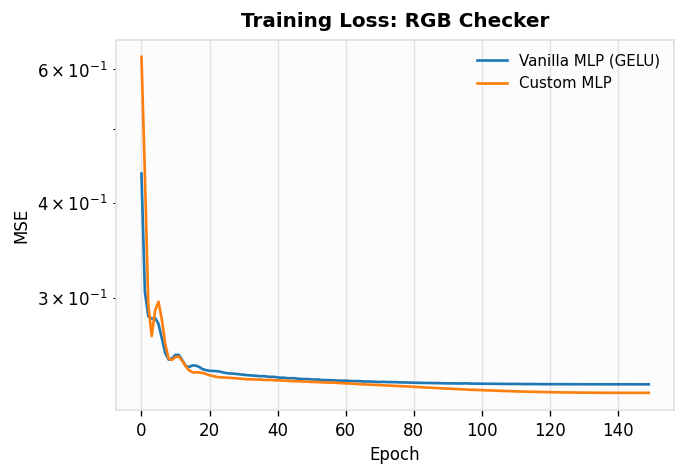

Saved: field_plots_fast/rgb_checker_loss.png


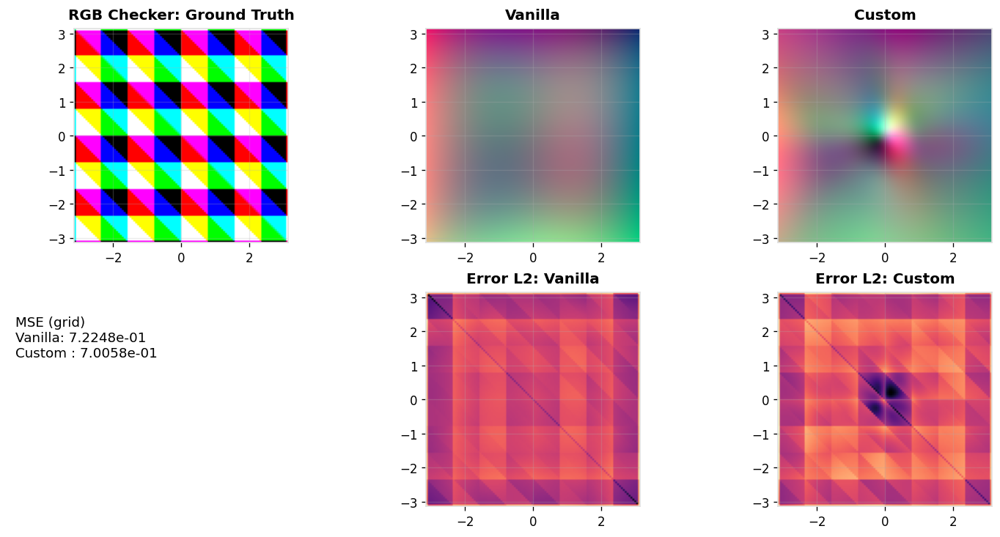

Saved: field_plots_fast/rgb_checker_rgb.png


In [8]:

import os
import math
import time
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# =========================
# 0) Repro + Device
# =========================
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)

torch.backends.cudnn.benchmark = True
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass

if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

print(f"Using device: {device}")

# Safe colormap getter (turbo is nice, fallback to viridis)
# Replace your existing get_cmap with this exact function
def get_cmap(name: str):
    import matplotlib
    import matplotlib.pyplot as plt

    # Try modern registry API (Matplotlib ≥ 3.6)
    colormaps = getattr(matplotlib, "colormaps", None)
    if colormaps is not None:
        try:
            return colormaps.get_cmap(name)
        except Exception:
            return colormaps.get_cmap("viridis")

    # Fallback for older Matplotlib versions
    try:
        return plt.get_cmap(name)
    except Exception:
        return plt.get_cmap("viridis")


# =========================
# 1) Models (generalized output_dim)
# =========================
class VanillaMLP(nn.Module):
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.act    = nn.GELU()
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        return x

class CustomMLP(nn.Module):
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.scale  = math.pi / math.sqrt(3.0)
        self.ln     = nn.LayerNorm(hidden_dim)
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = x**2 + 0.5 * x**3
        x = self.ln(x)
        x = x * torch.sigmoid(self.scale * x)
        x = self.c_proj(x)
        return x

# =========================
# 2) Styling
# =========================
def pretty_style():
    plt.rcParams.update({
        "figure.facecolor": "#ffffff",
        "axes.facecolor": "#fcfcfd",
        "axes.grid": True,
        "grid.alpha": 0.25,
        "axes.edgecolor": "#e0e0e0",
        "axes.linewidth": 1.0,
        "axes.titleweight": "semibold",
        "axes.titlepad": 8,
        "font.size": 10,
        "legend.frameon": False,
        "legend.fontsize": 9,
        "savefig.bbox": "tight",
    })

pretty_style()

# =========================
# 3) Problems (lighter n_train + res)
# =========================
def _make_sampler(n_train, xlim, ylim, seed=SEED):
    rng = np.random.RandomState(seed)
    xs = rng.uniform(xlim[0], xlim[1], size=(n_train, 1)).astype(np.float32)
    ys = rng.uniform(ylim[0], ylim[1], size=(n_train, 1)).astype(np.float32)
    return torch.from_numpy(np.concatenate([xs, ys], axis=1))

def _make_grid(grid_res, xlim, ylim):
    x = np.linspace(xlim[0], xlim[1], grid_res, dtype=np.float32)
    y = np.linspace(ylim[0], ylim[1], grid_res, dtype=np.float32)
    XX, YY = np.meshgrid(x, y, indexing="xy")
    pts = np.stack([XX.ravel(), YY.ravel()], axis=1).astype(np.float32)
    return XX, YY, torch.from_numpy(pts)

# --- Scalar fields (C=1) ---
def franke_xy(x, y):
    t1 = 0.75 * np.exp(-((9*x-2)**2 + (9*y-2)**2)/4.0)
    t2 = 0.75 * np.exp(-((9*x+1)**2)/49.0 - (9*y+1)/10.0)
    t3 = 0.5  * np.exp(-((9*x-7)**2 + (9*y-3)**2)/4.0)
    t4 = 0.2  * np.exp(-((9*x-4)**2 + (9*y-7)**2))
    return t1 + t2 + t3 - t4

def franke_problem(n_train=2500, grid_res=112):
    xlim = ylim = (0.0, 1.0)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:, 0].numpy(), X[:, 1].numpy()
    z = franke_xy(x, y).astype(np.float32)[:, None]
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    zz = franke_xy(P[:,0].numpy(), P[:,1].numpy()).astype(np.float32)
    GT = zz.reshape(grid_res, grid_res)[:, :, None]
    return X, torch.from_numpy(z), (XX, YY, torch.from_numpy(GT)), 1

def peaks_xy(x, y):
    return (3*(1-x)**2 * np.exp(-x**2 - (y+1)**2)
            - 10*(x/5 - x**3 - y**5) * np.exp(-x**2 - y**2)
            - (1/3)*np.exp(-(x+1)**2 - y**2))

def peaks_problem(n_train=2500, grid_res=112):
    xlim = ylim = (-3.0, 3.0)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:,0].numpy(), X[:,1].numpy()
    z = peaks_xy(x, y).astype(np.float32)[:, None]
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    zz = peaks_xy(P[:,0].numpy(), P[:,1].numpy()).astype(np.float32)
    GT = zz.reshape(grid_res, grid_res)[:, :, None]
    return X, torch.from_numpy(z), (XX, YY, torch.from_numpy(GT)), 1

def periodic_wells_problem(n_train=2500, grid_res=112, k=3):
    xlim = ylim = (-math.pi, math.pi)
    X = _make_sampler(n_train, xlim, ylim)
    z = (np.cos(k*X[:,0].numpy()) + np.cos(k*X[:,1].numpy())).astype(np.float32)[:, None]
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    zz = (np.cos(k*P[:,0].numpy()) + np.cos(k*P[:,1].numpy())).astype(np.float32)
    GT = zz.reshape(grid_res, grid_res)[:, :, None]
    return X, torch.from_numpy(z), (XX, YY, torch.from_numpy(GT)), 1

def ripple_problem(n_train=2500, grid_res=112):
    xlim = ylim = (-math.pi, math.pi)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:,0].numpy(), X[:,1].numpy()
    z = (np.sin(3*x)*np.cos(3*y) + 0.5*np.sin(5*x + y)).astype(np.float32)[:, None]
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    px, py = P[:,0].numpy(), P[:,1].numpy()
    zz = (np.sin(3*px)*np.cos(3*py) + 0.5*np.sin(5*px + py)).astype(np.float32)
    GT = zz.reshape(grid_res, grid_res)[:, :, None]
    return X, torch.from_numpy(z), (XX, YY, torch.from_numpy(GT)), 1

def ring_sdf_problem(n_train=2500, grid_res=112, r0=1.2):
    xlim = ylim = (-2.0, 2.0)
    X = _make_sampler(n_train, xlim, ylim)
    r = np.sqrt(X[:,0].numpy()**2 + X[:,1].numpy()**2)
    z = (r - r0).astype(np.float32)[:, None]
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    rr = np.sqrt(P[:,0].numpy()**2 + P[:,1].numpy()**2)
    zz = (rr - r0).astype(np.float32)
    GT = zz.reshape(grid_res, grid_res)[:, :, None]
    return X, torch.from_numpy(z), (XX, YY, torch.from_numpy(GT)), 1

# --- RGB vector fields (C=3) ---
def rgb_swirls_problem(n_train=3000, grid_res=112):
    xlim = ylim = (-math.pi, math.pi)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:,0].numpy(), X[:,1].numpy()
    R = 0.5*(np.sin(3*x) + 1.0)
    G = 0.5*(np.cos(3*y) + 1.0)
    B = 0.5*(np.sin(2*x + 2*y) + 1.0)
    Z = np.stack([R, G, B], axis=1).astype(np.float32)
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    px, py = P[:,0].numpy(), P[:,1].numpy()
    Rg = 0.5*(np.sin(3*px) + 1.0)
    Gg = 0.5*(np.cos(3*py) + 1.0)
    Bg = 0.5*(np.sin(2*px + 2*py) + 1.0)
    GT = np.stack([Rg, Gg, Bg], axis=1).astype(np.float32).reshape(grid_res, grid_res, 3)
    return X, torch.from_numpy(Z), (XX, YY, torch.from_numpy(GT)), 3

def rgb_polar_problem(n_train=3000, grid_res=112):
    xlim = ylim = (-2.0, 2.0)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:,0].numpy(), X[:,1].numpy()
    theta = np.arctan2(y, x); r = np.sqrt(x**2 + y**2)
    R = 0.5*(np.sin(3*theta) + 1.0)
    G = np.exp(-r**2)
    B = 0.5*(np.cos(5*theta) + 1.0)
    Z = np.stack([R, G, B], axis=1).astype(np.float32)
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    px, py = P[:,0].numpy(), P[:,1].numpy()
    th = np.arctan2(py, px); rr = np.sqrt(px**2 + py**2)
    Rg = 0.5*(np.sin(3*th) + 1.0)
    Gg = np.exp(-rr**2)
    Bg = 0.5*(np.cos(5*th) + 1.0)
    GT = np.stack([Rg, Gg, Bg], axis=1).astype(np.float32).reshape(grid_res, grid_res, 3)
    return X, torch.from_numpy(Z), (XX, YY, torch.from_numpy(GT)), 3

def rgb_checker_problem(n_train=3000, grid_res=112, k=4):
    xlim = ylim = (-math.pi, math.pi)
    X = _make_sampler(n_train, xlim, ylim)
    x, y = X[:,0].numpy(), X[:,1].numpy()
    R = 0.5*(np.sign(np.sin(k*x)) + 1.0)
    G = 0.5*(np.sign(np.sin(k*y)) + 1.0)
    B = 0.5*(np.sign(np.sin(k*(x+y))) + 1.0)
    Z = np.stack([R, G, B], axis=1).astype(np.float32)
    XX, YY, P = _make_grid(grid_res, xlim, ylim)
    px, py = P[:,0].numpy(), P[:,1].numpy()
    Rg = 0.5*(np.sign(np.sin(k*px)) + 1.0)
    Gg = 0.5*(np.sign(np.sin(k*py)) + 1.0)
    Bg = 0.5*(np.sign(np.sin(k*(px+py))) + 1.0)
    GT = np.stack([Rg, Gg, Bg], axis=1).astype(np.float32).reshape(grid_res, grid_res, 3)
    return X, torch.from_numpy(Z), (XX, YY, torch.from_numpy(GT)), 3

PROBLEMS = {
    # scalar
    "Franke": franke_problem,
    "Peaks": peaks_problem,
    "Periodic Wells (scalar)": periodic_wells_problem,
    "Ripple": ripple_problem,
    "Ring SDF": ring_sdf_problem,
    # RGB
    "RGB Swirls": rgb_swirls_problem,
    "RGB Polar": rgb_polar_problem,
    "RGB Checker": rgb_checker_problem,
}

# =========================
# 4) DataLoader + Training (MSE) — faster defaults
# =========================
def make_loader(X, Y, batch_size=2048, shuffle=True):
    ds = TensorDataset(X, Y)
    # Data small: worker overhead can dominate; keep workers=0
    return DataLoader(ds, batch_size=batch_size, shuffle=shuffle, drop_last=False,
                      pin_memory=(device.type == "cuda"), num_workers=0)

def train_regression(model, loader, epochs=120, lr=2e-3, use_amp=True):
    model = model.to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    # Cosine schedule helps with fewer epochs
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
    scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
    losses = []
    model.train()
    for ep in range(epochs):
        total, count = 0.0, 0
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            optimizer.zero_grad(set_to_none=True)
            if device.type == "cuda" and use_amp:
                with torch.cuda.amp.autocast():
                    pred = model(xb)
                    loss = criterion(pred, yb)
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()
            else:
                pred = model(xb)
                loss = criterion(pred, yb)
                loss.backward()
                optimizer.step()
            bs = xb.size(0)
            total += loss.detach().item() * bs
            count += bs
        scheduler.step()
        losses.append(total / max(1, count))
    model.eval()
    return losses, model


# =========================
# 5) Visualization helpers (lighter: smaller dpi, fewer colorbars)
# =========================
def to_numpy_img(field, vmin=None, vmax=None):
    if torch.is_tensor(field):
        arr = field.detach().cpu().numpy()
    else:
        arr = field
    if arr.ndim == 2:
        arr = arr[..., None]
    img = arr.copy()
    if img.shape[2] == 1:
        lo = np.min(img) if vmin is None else vmin
        hi = np.max(img) if vmax is None else vmax
        if hi <= lo: hi = lo + 1e-6
        img = (img - lo) / (hi - lo)
        img = np.clip(img, 0.0, 1.0)
        img = np.repeat(img, 3, axis=2)
    else:
        img = np.clip(img, 0.0, 1.0)
    return img

@torch.no_grad()
def eval_on_grid(model, P, H, W, out_dim, batch=65536):
    preds = []
    for i in range(0, P.size(0), batch):
        chunk = P[i:i+batch].to(device, non_blocking=True)
        out = model(chunk)
        preds.append(out.detach().cpu())
    return torch.cat(preds, dim=0).reshape(H, W, out_dim)

def show_scalar(name, XX, YY, GT, pred_van, pred_cus, out_dir, cmap_name="turbo"):
    cmap = get_cmap(cmap_name)
    H, W = GT.shape[:2]
    vmin, vmax = float(GT.min()), float(GT.max())
    GT_img  = to_numpy_img(GT, vmin, vmax)[:, :, 0]
    VAN_img = to_numpy_img(pred_van, vmin, vmax)[:, :, 0]
    CUS_img = to_numpy_img(pred_cus, vmin, vmax)[:, :, 0]
    err_van = np.abs((pred_van.detach().cpu().numpy() - GT)).squeeze(-1)
    err_cus = np.abs((pred_cus.detach().cpu().numpy() - GT)).squeeze(-1)

    fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=True)
    axes[0,0].imshow(GT_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,0].set_title(f"{name}: Ground Truth")
    axes[0,1].imshow(VAN_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,1].set_title("Vanilla")
    axes[0,2].imshow(CUS_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,2].set_title("Custom")

    axes[1,1].imshow(err_van, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,1].set_title("Abs Error: Vanilla")
    axes[1,2].imshow(err_cus, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,2].set_title("Abs Error: Custom")
    axes[1,0].axis("off")
    axes[1,0].text(0.02, 0.7,
                   f"MSE (grid)\nVanilla: {np.mean(err_van**2):.4e}\nCustom : {np.mean(err_cus**2):.4e}",
                   fontsize=11, transform=axes[1,0].transAxes)

    os.makedirs(out_dir, exist_ok=True)
    path = os.path.join(out_dir, f"{name.replace(' ','_').lower()}_scalar.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

def show_rgb(name, XX, YY, GT, pred_van, pred_cus, out_dir):
    GT_img  = to_numpy_img(GT)
    VAN_img = np.clip(pred_van.detach().cpu().numpy(), 0.0, 1.0)
    CUS_img = np.clip(pred_cus.detach().cpu().numpy(), 0.0, 1.0)
    err_van = np.sqrt(np.sum((VAN_img - GT_img)**2, axis=2))
    err_cus = np.sqrt(np.sum((CUS_img - GT_img)**2, axis=2))

    fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=True)
    axes[0,0].imshow(GT_img, origin="lower",
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,0].set_title(f"{name}: Ground Truth")
    axes[0,1].imshow(VAN_img, origin="lower",
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,1].set_title("Vanilla")
    axes[0,2].imshow(CUS_img, origin="lower",
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,2].set_title("Custom")

    axes[1,1].imshow(err_van, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,1].set_title("Error L2: Vanilla")
    axes[1,2].imshow(err_cus, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,2].set_title("Error L2: Custom")

    axes[1,0].axis("off")
    axes[1,0].text(0.02, 0.7,
                   f"MSE (grid)\nVanilla: {np.mean(err_van**2):.4e}\nCustom : {np.mean(err_cus**2):.4e}",
                   fontsize=11, transform=axes[1,0].transAxes)

    os.makedirs(out_dir, exist_ok=True)
    path = os.path.join(out_dir, f"{name.replace(' ','_').lower()}_rgb.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

def plot_loss_curves(name, loss_van, loss_cus, out_dir):
    plt.figure(figsize=(6, 4))
    plt.plot(loss_van, label="Vanilla MLP (GELU)", linewidth=1.6)
    plt.plot(loss_cus, label="Custom MLP", linewidth=1.6)
    plt.yscale("log")
    plt.xlabel("Epoch"); plt.ylabel("MSE")
    plt.title(f"Training Loss: {name}")
    plt.grid(True, alpha=0.35)
    plt.legend()
    os.makedirs(out_dir, exist_ok=True)
    path = os.path.join(out_dir, f"{name.replace(' ','_').lower()}_loss.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

# =========================
# 6) Main Harness (fast defaults)
# =========================
def run_field_harness_fast(
    hidden_dim=160,
    lr=2e-3,
    epochs=120,
    batch_size=2048,
    grid_res=112,
    use_amp=True,
    out_dir="field_plots_fast",
    problems_subset=None,   # list of names to run, or None for all
):
    os.makedirs(out_dir, exist_ok=True)
    names = problems_subset or list(PROBLEMS.keys())
    for name in names:
        print(f"\n=== Problem: {name} ===")
        builder = PROBLEMS[name]
        X, Y, (XX, YY, GT), out_dim = builder(grid_res=grid_res)

        loader = make_loader(X.float(), Y.float(), batch_size=batch_size, shuffle=True)

        vanilla = VanillaMLP(input_dim=2, hidden_dim=hidden_dim, output_dim=out_dim)
        custom  = CustomMLP(input_dim=2, hidden_dim=hidden_dim, output_dim=out_dim)

        loss_van, m_van = train_regression(vanilla, loader, epochs=epochs, lr=lr, use_amp=use_amp)
        loss_cus, m_cus = train_regression(custom,  loader, epochs=epochs, lr=lr, use_amp=use_amp)

        plot_loss_curves(name, loss_van, loss_cus, out_dir)

        # Batched grid eval
        P = torch.stack([
            torch.from_numpy(XX.astype(np.float32)).reshape(-1),
            torch.from_numpy(YY.astype(np.float32)).reshape(-1)
        ], dim=1)
        pred_van = eval_on_grid(m_van, P, GT.shape[0], GT.shape[1], out_dim)
        pred_cus = eval_on_grid(m_cus, P, GT.shape[0], GT.shape[1], out_dim)

        if out_dim == 1:
            show_scalar(name, XX, YY, GT.numpy(), pred_van, pred_cus, out_dir, cmap_name="turbo")
        else:
            show_rgb(name, XX, YY, GT.numpy(), pred_van, pred_cus, out_dir)

# =========================
# 7) Execute (fast preset)
# =========================
if __name__ == "__main__":
    # To trim further, pass problems_subset=["Franke","Periodic Wells (scalar)","RGB Swirls"]
    run_field_harness_fast(
        hidden_dim=256,
        lr=2e-3,
        epochs=150,       # fewer epochs + cosine schedule
        batch_size=2048,  # large batches keep kernels fat on GPU
        grid_res=112,     # lower image resolution reduces eval + plotting cost
        use_amp=True,
        out_dir="field_plots_fast",
        problems_subset=None,
    )


Using device: cuda

=== Problem: ND Periodic Sum | D=8 | kind=regression ===


/tmp/ipython-input-1828071660.py:109: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
/tmp/ipython-input-1828071660.py:119: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  Test MSE: Vanilla=5.5709e-02 | Custom=5.9489e-02


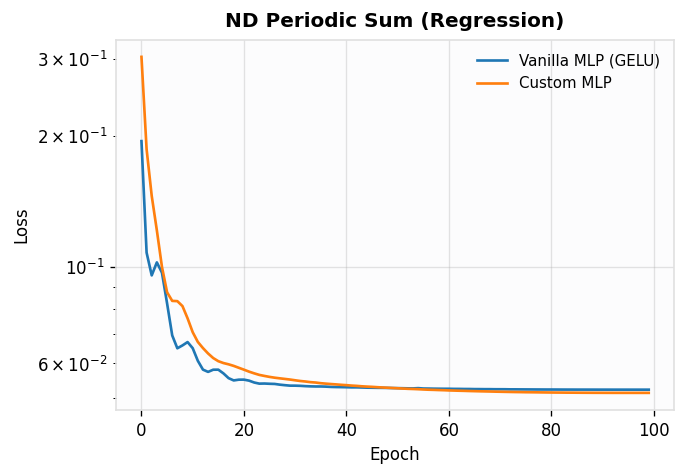

Saved: highD_plots/nd_periodic_sum_(regression)_loss.png


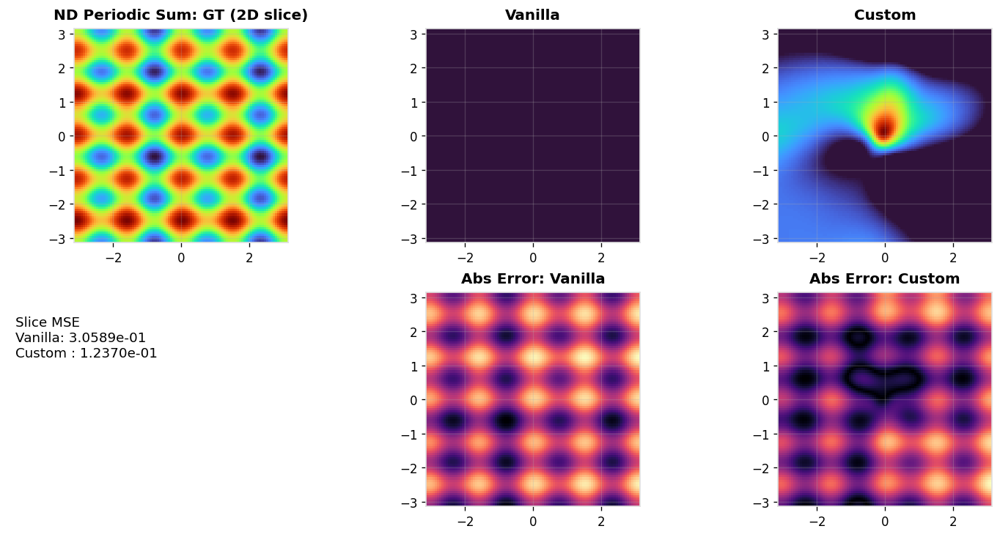

Saved: highD_plots/nd_periodic_sum_slice.png

=== Problem: ND Rastrigin | D=10 | kind=regression ===
  Test MSE: Vanilla=7.6028e+03 | Custom=6.8085e+03


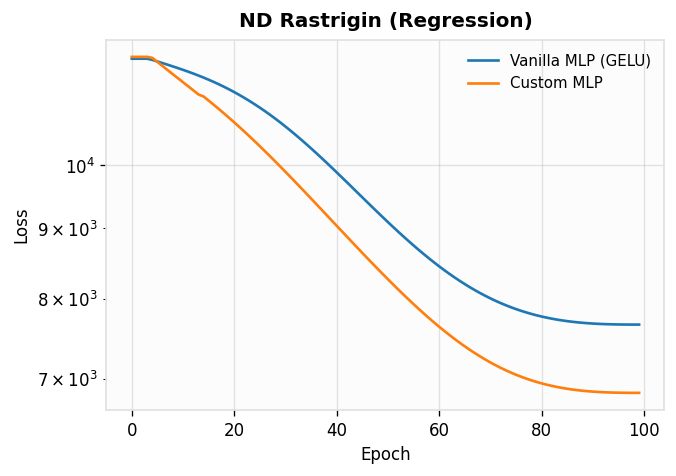

Saved: highD_plots/nd_rastrigin_(regression)_loss.png


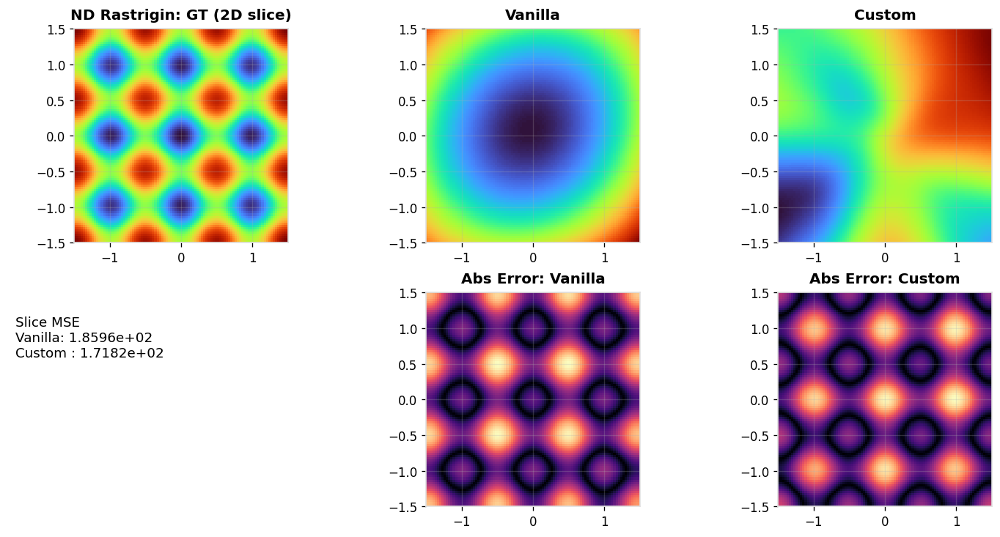

Saved: highD_plots/nd_rastrigin_slice.png

=== Problem: ND Rosenbrock | D=10 | kind=regression ===
  Test MSE: Vanilla=2.0106e+07 | Custom=2.0158e+07


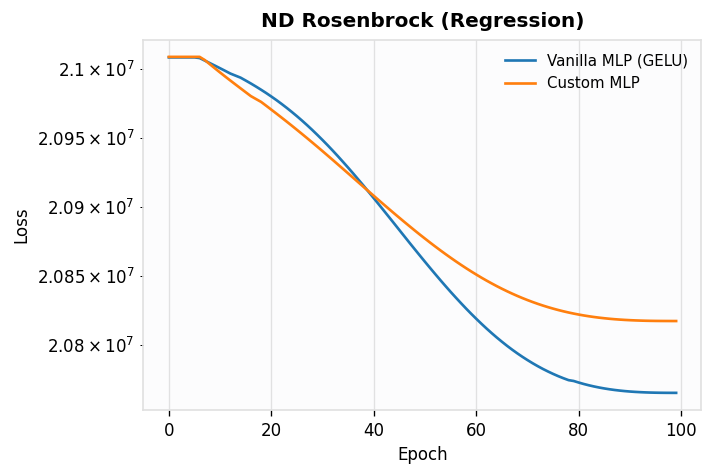

Saved: highD_plots/nd_rosenbrock_(regression)_loss.png


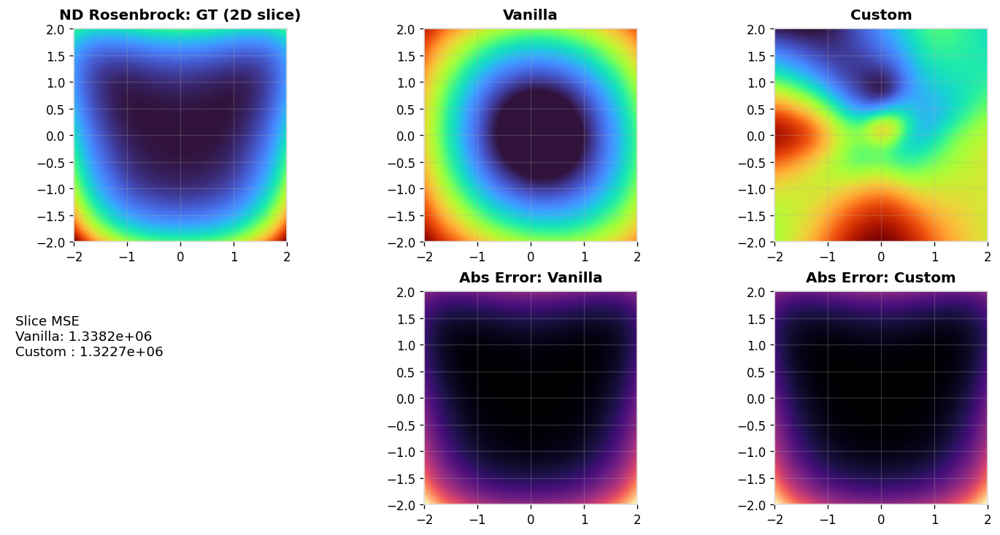

Saved: highD_plots/nd_rosenbrock_slice.png

=== Problem: HyperShell (band) | D=12 | kind=classification ===


/tmp/ipython-input-1828071660.py:143: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
/tmp/ipython-input-1828071660.py:153: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


  Test Acc: Vanilla=1.0000 | Custom=1.0000


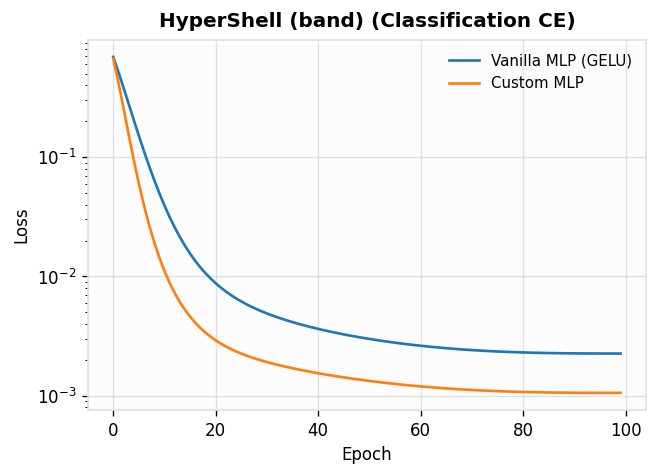

Saved: highD_plots/hypershell_(band)_(classification_ce)_loss.png


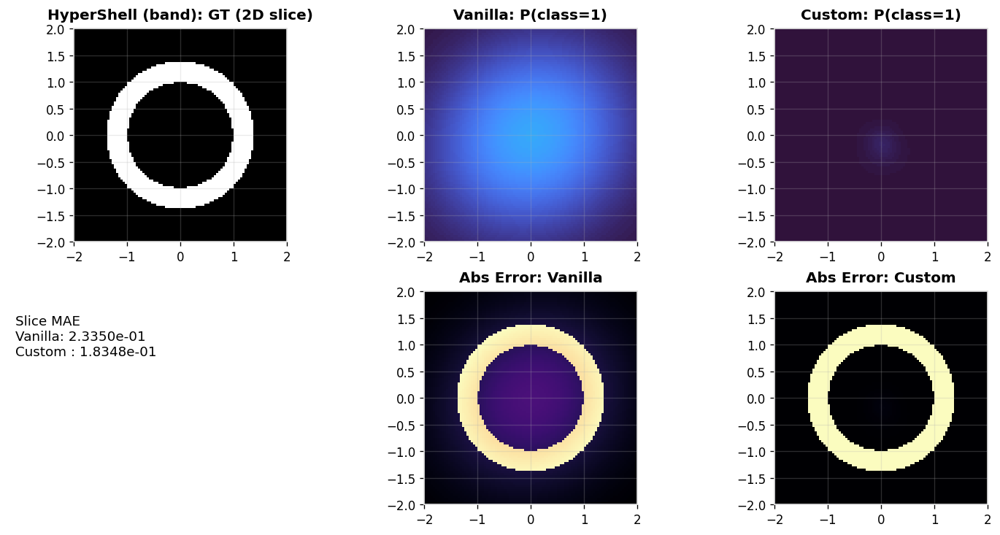

Saved: highD_plots/hypershell_(band)_slice.png

=== Problem: XOR-nD (parity of signs) | D=16 | kind=classification ===
  Test Acc: Vanilla=0.5065 | Custom=0.5165


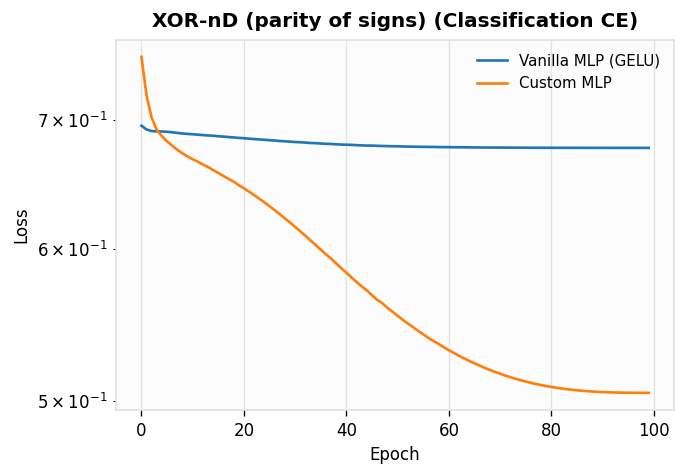

Saved: highD_plots/xor-nd_(parity_of_signs)_(classification_ce)_loss.png


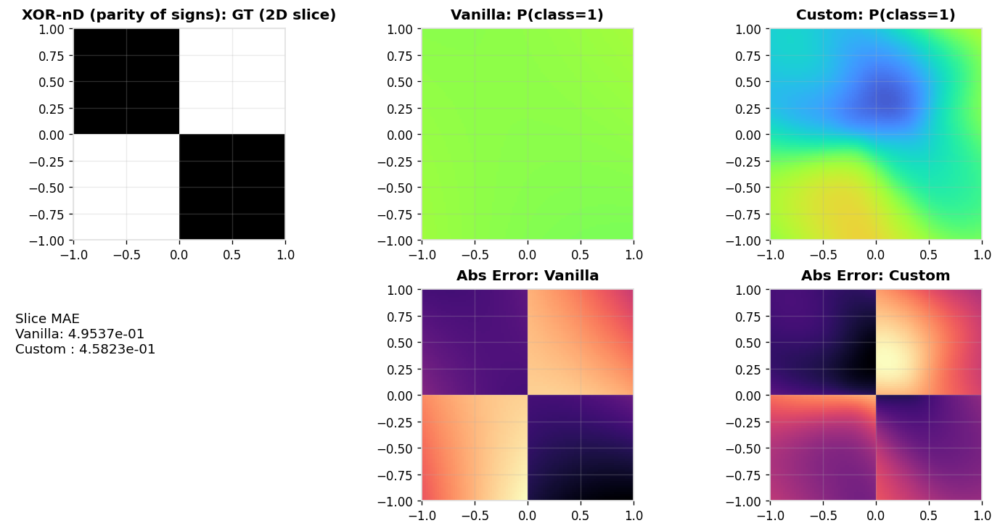

Saved: highD_plots/xor-nd_(parity_of_signs)_slice.png

=== Problem: HyperChecker (prod sin) | D=10 | kind=classification ===
  Test Acc: Vanilla=0.4860 | Custom=0.5040


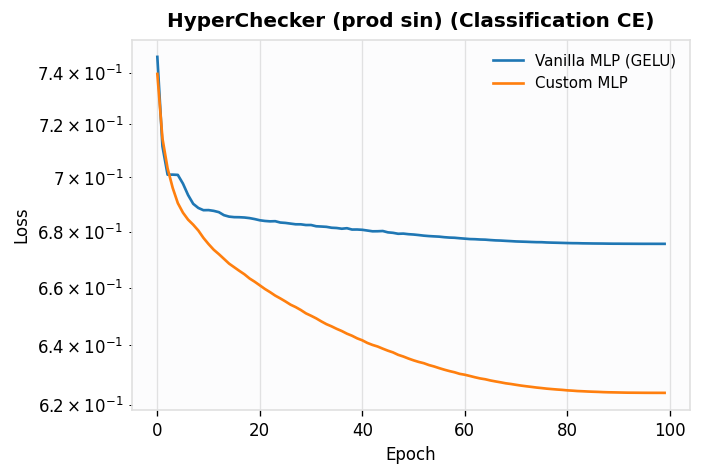

Saved: highD_plots/hyperchecker_(prod_sin)_(classification_ce)_loss.png


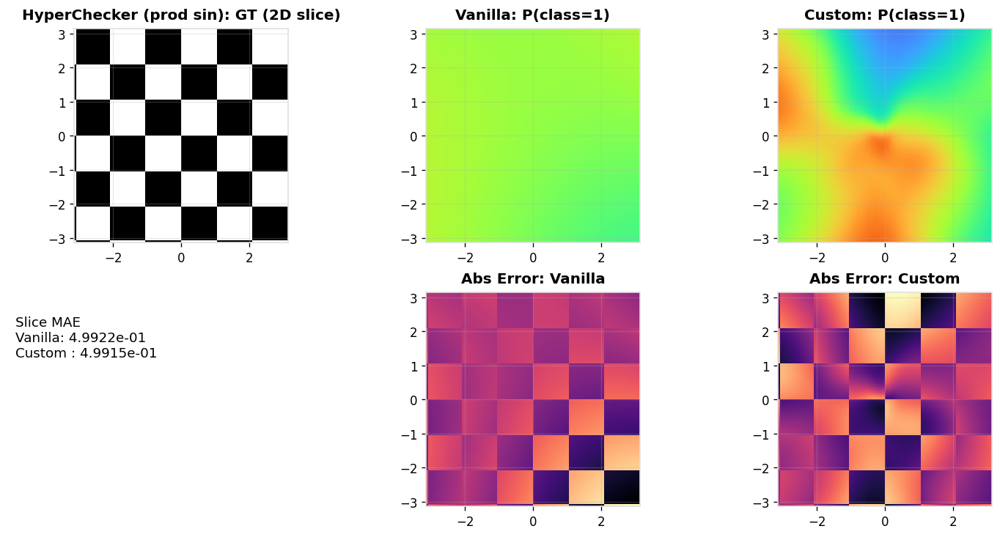

Saved: highD_plots/hyperchecker_(prod_sin)_slice.png

=== Problem: SwissRoll-3D embed | D=10 | kind=classification ===
  Test Acc: Vanilla=0.9135 | Custom=0.9065


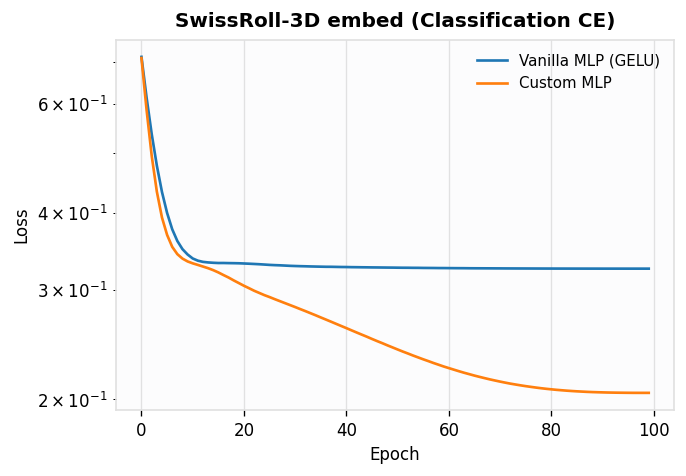

Saved: highD_plots/swissroll-3d_embed_(classification_ce)_loss.png


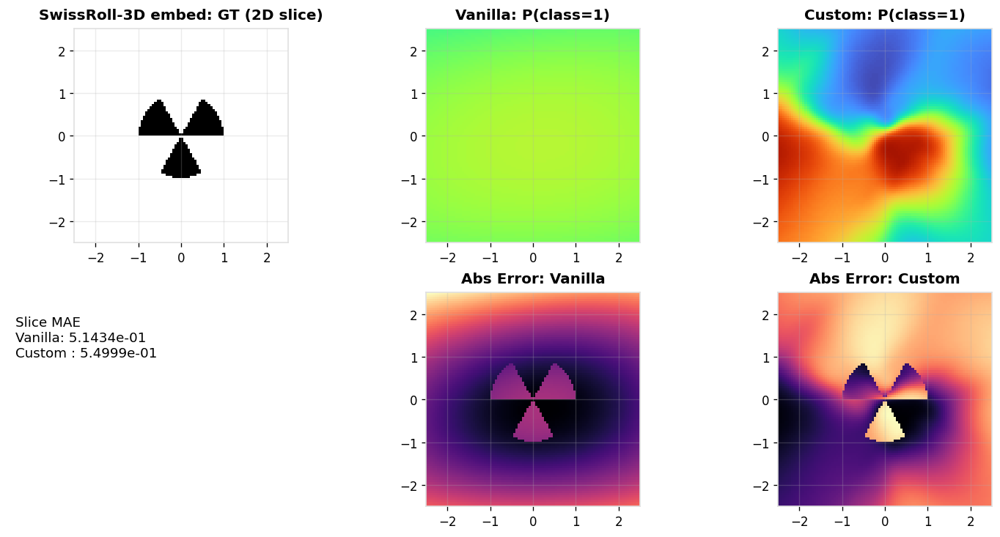

Saved: highD_plots/swissroll-3d_embed_slice.png


In [9]:

import os
import math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader

# =========================
# 0) Repro + Device
# =========================
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
torch.backends.cudnn.benchmark = True
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass

if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

# =========================
# 1) Safe colormap getter
# =========================
def get_cmap(name: str):
    import matplotlib
    import matplotlib.pyplot as plt
    colormaps = getattr(matplotlib, "colormaps", None)
    if colormaps is not None:
        try:
            return colormaps.get_cmap(name)
        except Exception:
            return colormaps.get_cmap("viridis")
    try:
        return plt.get_cmap(name)
    except Exception:
        return plt.get_cmap("viridis")

# =========================
# 2) Models (generalized output_dim)
# =========================
class VanillaMLP(nn.Module):
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.act    = nn.GELU()
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        return x

class CustomMLP(nn.Module):
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.scale  = math.pi / math.sqrt(3.0)
        self.ln     = nn.LayerNorm(hidden_dim)
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = x**2 + 0.5 * x**3
        x = self.ln(x)
        x = x * torch.sigmoid(self.scale * x)
        x = self.c_proj(x)
        return x

# =========================
# 3) Helpers: style, loaders, training
# =========================
def pretty_style():
    plt.rcParams.update({
        "figure.facecolor": "#ffffff",
        "axes.facecolor": "#fcfcfd",
        "axes.grid": True,
        "grid.alpha": 0.25,
        "axes.edgecolor": "#e0e0e0",
        "axes.linewidth": 1.0,
        "axes.titleweight": "semibold",
        "axes.titlepad": 8,
        "font.size": 10,
        "legend.frameon": False,
        "legend.fontsize": 9,
        "savefig.bbox": "tight",
    })
pretty_style()

def make_loader(X, Y, batch_size=2048, shuffle=True):
    ds = TensorDataset(X, Y)
    return DataLoader(ds, batch_size=batch_size, shuffle=shuffle, drop_last=False,
                      pin_memory=(device.type == "cuda"), num_workers=0)

def train_regression(model, loader, epochs=100, lr=2e-3, use_amp=True):
    model = model.to(device)
    crit = nn.MSELoss()
    opt  = optim.Adam(model.parameters(), lr=lr)
    sch  = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
    losses = []
    model.train()
    for ep in range(epochs):
        total = 0.0; count = 0
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            opt.zero_grad(set_to_none=True)
            if device.type == "cuda" and use_amp:
                with torch.cuda.amp.autocast():
                    pred = model(xb)
                    loss = crit(pred, yb)
                scaler.scale(loss).backward()
                scaler.step(opt)
                scaler.update()
            else:
                pred = model(xb)
                loss = crit(pred, yb)
                loss.backward()
                opt.step()
            bs = xb.size(0)
            total += loss.detach().item() * bs
            count += bs
        sch.step()
        losses.append(total / max(1, count))
    model.eval()
    return losses, model

def train_classification(model, loader, epochs=100, lr=2e-3, use_amp=True):
    model = model.to(device)
    crit = nn.CrossEntropyLoss()
    opt  = optim.Adam(model.parameters(), lr=lr)
    sch  = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
    losses = []
    model.train()
    for ep in range(epochs):
        total = 0.0; count = 0
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            opt.zero_grad(set_to_none=True)
            if device.type == "cuda" and use_amp:
                with torch.cuda.amp.autocast():
                    logits = model(xb)
                    loss = crit(logits, yb)
                scaler.scale(loss).backward()
                scaler.step(opt)
                scaler.update()
            else:
                logits = model(xb)
                loss = crit(logits, yb)
                loss.backward()
                opt.step()
            bs = xb.size(0)
            total += loss.detach().item() * bs
            count += bs
        sch.step()
        losses.append(total / max(1, count))
    model.eval()
    return losses, model

@torch.no_grad()
def eval_accuracy(model, X, y, batch=65536):
    correct = 0; total = 0
    for i in range(0, X.size(0), batch):
        xb = X[i:i+batch].to(device)
        logits = model(xb)
        pred = torch.argmax(logits, dim=1).cpu()
        correct += (pred == y[i:i+batch]).sum().item()
        total   += xb.size(0)
    return correct / max(1, total)

@torch.no_grad()
def eval_mse(model, X, y, batch=65536):
    crit = nn.MSELoss(reduction="sum")
    total = 0.0
    for i in range(0, X.size(0), batch):
        xb = X[i:i+batch].to(device)
        yb = y[i:i+batch].to(device)
        pred = model(xb)
        total += crit(pred, yb).item()
    return total / max(1, X.size(0))

# =========================
# 4) Higher-D problems
# =========================
class HDProblem:
    def __init__(self, name, D, kind, bounds, gen_func, out_dim):
        """
        name: str
        D: input dimension
        kind: "regression" or "classification"
        bounds: array-like shape [D,2] with (min,max) per dim
        gen_func: callable(X: [N,D] float32) -> Y
            regression: Y->[N,1] float32
            classification: Y->[N] int64 (0/1)
        out_dim: 1 for regression, 2 for classification (2 logits)
        """
        self.name = name
        self.D = D
        self.kind = kind
        self.bounds = np.array(bounds, dtype=np.float32)
        self.gen_func = gen_func
        self.out_dim = out_dim

    def sample(self, n):
        lows = self.bounds[:,0]; highs = self.bounds[:,1]
        U = np.random.rand(n, self.D).astype(np.float32)
        X = lows + (highs - lows) * U
        X = torch.from_numpy(X)
        y = self.gen_func(X)
        return X.float(), y

    def slice_grid(self, grid_res=96, fixed_val=None, dims=(0,1)):
        lows = self.bounds[:,0]; highs = self.bounds[:,1]
        d0, d1 = dims
        x0 = np.linspace(lows[d0], highs[d0], grid_res, dtype=np.float32)
        x1 = np.linspace(lows[d1], highs[d1], grid_res, dtype=np.float32)
        XX, YY = np.meshgrid(x0, x1, indexing="xy")
        if fixed_val is None:
            fixed_val = np.zeros(self.D, dtype=np.float32)
        base = np.broadcast_to(fixed_val[None, :], (grid_res*grid_res, self.D)).copy()
        base[:, d0] = XX.ravel()
        base[:, d1] = YY.ravel()
        P = torch.from_numpy(base.astype(np.float32))
        # Ground truth on the slice
        if self.kind == "regression":
            GT = self.gen_func(P).view(grid_res, grid_res, 1).numpy()
        else:
            GT = self.gen_func(P).view(grid_res, grid_res, 1).numpy().astype(np.float32)
        return XX, YY, P, GT

# ---- Problem definitions ----
def periodic_nd_regression(D=8, k_base=3):
    bounds = [(-math.pi, math.pi)] * D
    freqs = (k_base + np.arange(D)) % 5 + 1  # small variety

    def f(X):
        x = X.numpy()
        val = np.zeros((x.shape[0], 1), dtype=np.float32)
        for i in range(D):
            val[:,0] += np.cos(freqs[i]*x[:,i]) + 0.3*np.sin(2*x[:,i])
        val[:,0] /= D
        return torch.from_numpy(val)
    return HDProblem("ND Periodic Sum", D, "regression", bounds, f, out_dim=1)

def rastrigin_nd(D=10, A=10.0):
    bounds = [(-1.5, 1.5)] * D
    def f(X):
        x = X.numpy()
        val = A * D + np.sum(x**2 - A * np.cos(2*np.pi*x), axis=1, keepdims=True)
        return torch.from_numpy(val.astype(np.float32))
    return HDProblem("ND Rastrigin", D, "regression", bounds, f, out_dim=1)

def rosenbrock_nd(D=10, a=1.0, b=100.0):
    bounds = [(-2.0, 2.0)] * D
    def f(X):
        x = X.numpy()
        s = np.zeros((x.shape[0],), dtype=np.float32)
        for i in range(D-1):
            s += b * (x[:,i+1] - x[:,i]**2)**2 + (a - x[:,i])**2
        return torch.from_numpy(s[:,None])
    return HDProblem("ND Rosenbrock", D, "regression", bounds, f, out_dim=1)

def hypershell_binary(D=12, r1=1.0, r2=1.4):
    bounds = [(-2.0, 2.0)] * D
    def g(X):
        x = X.numpy()
        r = np.linalg.norm(x, axis=1)
        y = ((r >= r1) & (r <= r2)).astype(np.int64)
        return torch.from_numpy(y)
    return HDProblem("HyperShell (band)", D, "classification", bounds, g, out_dim=2)

def xornD_binary(D=16):
    bounds = [(-1.0, 1.0)] * D
    def g(X):
        x = X.numpy()
        signs = (x >= 0).astype(np.int32)*2 - 1
        y = (np.prod(signs, axis=1) > 0).astype(np.int64)
        return torch.from_numpy(y)
    return HDProblem("XOR-nD (parity of signs)", D, "classification", bounds, g, out_dim=2)

def hyperchecker_binary(D=10, k=3):
    bounds = [(-math.pi, math.pi)] * D
    def g(X):
        x = X.numpy()
        s = np.prod(np.sign(np.sin(k*x) + 1e-6), axis=1)  # avoid zero
        y = (s > 0).astype(np.int64)
        return torch.from_numpy(y)
    return HDProblem("HyperChecker (prod sin)", D, "classification", bounds, g, out_dim=2)

def swissroll_3d_embed(D=10, noise=0.1, gap=0.8):
    assert D >= 3
    bounds = [(-2.5, 2.5)] * D
    def g(X):
        # Build points then map to labels independent of passed X, for data generation only
        # But for GT evaluation on slice, create a synthetic function from coords:
        x = X.numpy()
        # Use first 3 dims as (x,y,z). Define class by two rolled sheets in (x,y),
        # separated in z by 'gap'. Label by which side of sine spiral the (x,y) falls,
        # and by z threshold.
        xx, yy, zz = x[:,0], x[:,1], x[:,2]
        t = np.arctan2(yy, xx)  # [-pi,pi]
        r = np.sqrt(xx**2 + yy**2)
        roll = np.sin(3*t)  # wave boundary in plane
        plane = (zz > gap*0.0).astype(np.int64)
        y = ((r - 1.0*np.sign(roll)) > 0).astype(np.int64) ^ plane  # xor with z-split
        return torch.from_numpy(y)
    return HDProblem("SwissRoll-3D embed", D, "classification", bounds, g, out_dim=2)

def build_highD_problems():
    return [
        periodic_nd_regression(D=8,  k_base=3),
        rastrigin_nd(D=10,          A=10.0),
        rosenbrock_nd(D=10,         a=1.0, b=100.0),
        hypershell_binary(D=12,     r1=1.0, r2=1.4),
        xornD_binary(D=16),
        hyperchecker_binary(D=10,   k=3),
        swissroll_3d_embed(D=10,    noise=0.1, gap=0.8),
    ]

# =========================
# 5) Visualization: 2D slice fields
# =========================
def to_numpy_img(field, vmin=None, vmax=None):
    if torch.is_tensor(field):
        arr = field.detach().cpu().numpy()
    else:
        arr = field
    if arr.ndim == 2:
        arr = arr[..., None]
    img = arr.copy()
    if img.shape[2] == 1:
        lo = np.min(img) if vmin is None else vmin
        hi = np.max(img) if vmax is None else vmax
        if hi <= lo: hi = lo + 1e-6
        img = (img - lo) / (hi - lo)
        img = np.clip(img, 0.0, 1.0)
        img = np.repeat(img, 3, axis=2)
    else:
        img = np.clip(img, 0.0, 1.0)
    return img

@torch.no_grad()
def eval_on_slice(model, P, H, W, out_dim, kind, batch=65536):
    preds = []
    for i in range(0, P.size(0), batch):
        chunk = P[i:i+batch].to(device, non_blocking=True)
        out = model(chunk)
        if kind == "classification":
            out = torch.softmax(out, dim=1)[:,1:2]  # prob of class 1
        preds.append(out.detach().cpu())
    pred = torch.cat(preds, dim=0).reshape(H, W, -1)
    return pred

def show_scalar_slice(name, problem, XX, YY, GT, pred_van, pred_cus, out_dir, cmap_name="turbo"):
    cmap = get_cmap(cmap_name)
    H, W = GT.shape[:2]
    vmin, vmax = float(GT.min()), float(GT.max())
    GT_img  = to_numpy_img(GT, vmin, vmax)[:, :, 0]
    VAN_img = to_numpy_img(pred_van, vmin, vmax)[:, :, 0]
    CUS_img = to_numpy_img(pred_cus, vmin, vmax)[:, :, 0]
    err_van = np.abs((pred_van.detach().cpu().numpy() - GT)).squeeze(-1)
    err_cus = np.abs((pred_cus.detach().cpu().numpy() - GT)).squeeze(-1)

    fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=True)
    axes[0,0].imshow(GT_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,0].set_title(f"{name}: GT (2D slice)")
    axes[0,1].imshow(VAN_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,1].set_title("Vanilla")
    axes[0,2].imshow(CUS_img, origin="lower", cmap=cmap,
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[0,2].set_title("Custom")

    axes[1,1].imshow(err_van, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,1].set_title("Abs Error: Vanilla")
    axes[1,2].imshow(err_cus, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,2].set_title("Abs Error: Custom")
    axes[1,0].axis("off")
    axes[1,0].text(0.02, 0.7,
                   f"Slice MSE\nVanilla: {np.mean(err_van**2):.4e}\nCustom : {np.mean(err_cus**2):.4e}",
                   fontsize=11, transform=axes[1,0].transAxes)

    os.makedirs(out_dir, exist_ok=True)
    path = os.path.join(out_dir, f"{problem.name.replace(' ','_').lower()}_slice.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

def show_prob_slice(name, problem, XX, YY, GT, pred_van, pred_cus, out_dir):
    # GT is binary {0,1} on the slice. Preds are prob of class 1 in [0,1].
    gt_img  = GT[:, :, 0]
    van_img = np.clip(pred_van.detach().cpu().numpy()[:, :, 0], 0.0, 1.0)
    cus_img = np.clip(pred_cus.detach().cpu().numpy()[:, :, 0], 0.0, 1.0)
    err_van = np.abs(van_img - gt_img)
    err_cus = np.abs(cus_img - gt_img)

    fig, axes = plt.subplots(2, 3, figsize=(12, 6), constrained_layout=True)
    axes[0,0].imshow(gt_img, origin="lower", cmap=get_cmap("gray"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()], vmin=0, vmax=1)
    axes[0,0].set_title(f"{name}: GT (2D slice)")

    axes[0,1].imshow(van_img, origin="lower", cmap=get_cmap("turbo"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()], vmin=0, vmax=1)
    axes[0,1].set_title("Vanilla: P(class=1)")

    axes[0,2].imshow(cus_img, origin="lower", cmap=get_cmap("turbo"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()], vmin=0, vmax=1)
    axes[0,2].set_title("Custom: P(class=1)")

    axes[1,1].imshow(err_van, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,1].set_title("Abs Error: Vanilla")
    axes[1,2].imshow(err_cus, origin="lower", cmap=get_cmap("magma"),
                     extent=[XX.min(), XX.max(), YY.min(), YY.max()])
    axes[1,2].set_title("Abs Error: Custom")

    axes[1,0].axis("off")
    axes[1,0].text(0.02, 0.7,
                   f"Slice MAE\nVanilla: {np.mean(err_van):.4e}\nCustom : {np.mean(err_cus):.4e}",
                   fontsize=11, transform=axes[1,0].transAxes)

    os.makedirs(out_dir, exist_ok=True)
    path = os.path.join(out_dir, f"{problem.name.replace(' ','_').lower()}_slice.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

def plot_loss_curves(title, loss_van, loss_cus, out_dir):
    plt.figure(figsize=(6, 4))
    plt.plot(loss_van, label="Vanilla MLP (GELU)", linewidth=1.6)
    plt.plot(loss_cus, label="Custom MLP", linewidth=1.6)
    plt.yscale("log"); plt.grid(True, alpha=0.35)
    plt.xlabel("Epoch"); plt.ylabel("Loss")
    plt.title(title)
    plt.legend()
    os.makedirs(out_dir, exist_ok=True)
    safe = title.replace(" ", "_").lower()
    path = os.path.join(out_dir, f"{safe}_loss.png")
    plt.savefig(path, dpi=130)
    plt.show()
    print(f"Saved: {path}")

# =========================
# 6) Main harness
# =========================
def run_highD_harness(
    hidden_dim=256,
    lr=2e-3,
    epochs=100,
    batch_size=2048,
    grid_res=96,
    use_amp=True,
    n_train=4000,
    n_test=2000,
    out_dir="highD_plots",
    dims_to_slice=(0,1),
    problems_subset=None
):
    os.makedirs(out_dir, exist_ok=True)
    problems = build_highD_problems()
    if problems_subset is not None:
        name_set = set(problems_subset)
        problems = [p for p in problems if p.name in name_set]

    for prob in problems:
        print(f"\n=== Problem: {prob.name} | D={prob.D} | kind={prob.kind} ===")
        # Sample train/test
        Xtr, ytr = prob.sample(n_train)
        Xte, yte = prob.sample(n_test)

        # Prepare labels/targets for training
        if prob.kind == "regression":
            Ytr = ytr.float()
            Yte = yte.float()
            out_dim = 1
        else:
            Ytr = ytr.long()
            Yte = yte.long()
            out_dim = 2

        # Loaders
        loader = make_loader(Xtr, Ytr, batch_size=batch_size, shuffle=True)

        # Models
        vanilla = VanillaMLP(input_dim=prob.D, hidden_dim=hidden_dim, output_dim=out_dim)
        custom  = CustomMLP(input_dim=prob.D, hidden_dim=hidden_dim, output_dim=out_dim)

        # Train
        if prob.kind == "regression":
            loss_van, m_van = train_regression(vanilla, loader, epochs=epochs, lr=lr, use_amp=use_amp)
            loss_cus, m_cus = train_regression(custom,  loader, epochs=epochs, lr=lr, use_amp=use_amp)
            # Test MSE
            mse_van = eval_mse(m_van, Xte, Yte)
            mse_cus = eval_mse(m_cus, Xte, Yte)
            print(f"  Test MSE: Vanilla={mse_van:.4e} | Custom={mse_cus:.4e}")
            plot_loss_curves(f"{prob.name} (Regression)", loss_van, loss_cus, out_dir)
        else:
            loss_van, m_van = train_classification(vanilla, loader, epochs=epochs, lr=lr, use_amp=use_amp)
            loss_cus, m_cus = train_classification(custom,  loader, epochs=epochs, lr=lr, use_amp=use_amp)
            # Test Acc
            acc_van = eval_accuracy(m_van, Xte, Yte)
            acc_cus = eval_accuracy(m_cus, Xte, Yte)
            print(f"  Test Acc: Vanilla={acc_van:.4f} | Custom={acc_cus:.4f}")
            plot_loss_curves(f"{prob.name} (Classification CE)", loss_van, loss_cus, out_dir)

        # 2D slice visualization (dims_to_slice)
        fixed = np.zeros(prob.D, dtype=np.float32)
        XX, YY, P, GT = prob.slice_grid(grid_res=grid_res, fixed_val=fixed, dims=dims_to_slice)
        pred_van = eval_on_slice(m_van, P, GT.shape[0], GT.shape[1], out_dim, prob.kind)
        pred_cus = eval_on_slice(m_cus, P, GT.shape[0], GT.shape[1], out_dim, prob.kind)

        if prob.kind == "regression":
            show_scalar_slice(prob.name, prob, XX, YY, GT, pred_van, pred_cus, out_dir, cmap_name="turbo")
        else:
            show_prob_slice(prob.name, prob, XX, YY, GT, pred_van, pred_cus, out_dir)

# =========================
# 7) Execute (fast-but-meaningful defaults)
# =========================
if __name__ == "__main__":
    run_highD_harness(
        hidden_dim=256,
        lr=2e-3,
        epochs=100,          # keep modest for speed
        batch_size=2048,     # big batches on GPU
        grid_res=96,         # 2D slice resolution
        use_amp=True,
        n_train=4000,
        n_test=2000,
        out_dir="highD_plots",
        dims_to_slice=(0,1),
        problems_subset=None # e.g.: ["ND Periodic Sum","HyperShell (band)","XOR-nD (parity of signs)"]
    )


Using device: cuda


/tmp/ipython-input-913733624.py:156: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
/tmp/ipython-input-913733624.py:166: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Validation MSE (normalized): Vanilla=1.9095e+00 | Custom=1.8947e+00


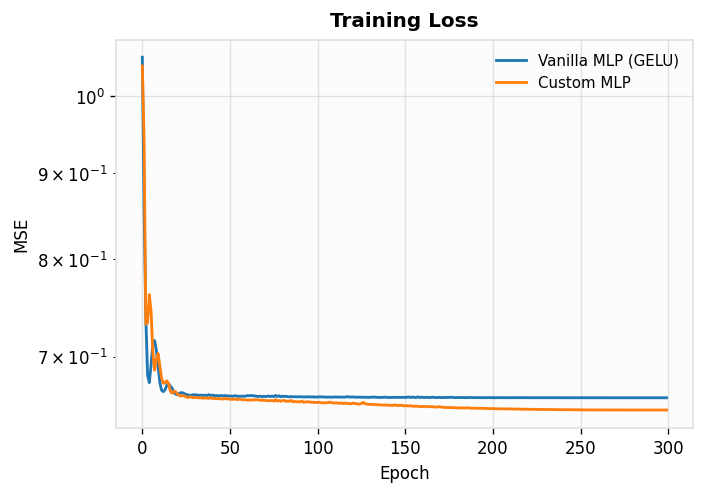

Saved: spiral3d_plots/loss.png


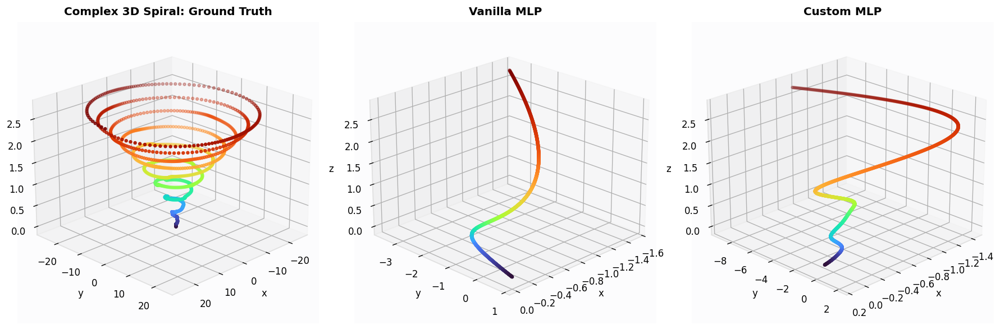

Saved: spiral3d_plots/spiral_3d.png


In [11]:

import os
import math
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401  (ensures 3D projection registered)

# =========================
# 0) Repro + Device + Style
# =========================
SEED = 42
torch.manual_seed(SEED)
np.random.seed(SEED)
torch.backends.cudnn.benchmark = True
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass

if torch.cuda.is_available():
    device = torch.device("cuda")
elif getattr(torch.backends, "mps", None) and torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

def pretty_style():
    plt.rcParams.update({
        "figure.facecolor": "#ffffff",
        "axes.facecolor": "#fcfcfd",
        "axes.grid": True,
        "grid.alpha": 0.25,
        "axes.edgecolor": "#e0e0e0",
        "axes.linewidth": 1.0,
        "axes.titleweight": "semibold",
        "axes.titlepad": 8,
        "font.size": 10,
        "legend.frameon": False,
        "legend.fontsize": 9,
        "savefig.bbox": "tight",
    })
pretty_style()

# Safe colormap getter (works across Matplotlib versions)
def get_cmap(name: str):
    import matplotlib
    import matplotlib.pyplot as plt
    colormaps = getattr(matplotlib, "colormaps", None)
    if colormaps is not None:
        try:
            return colormaps.get_cmap(name)
        except Exception:
            return colormaps.get_cmap("viridis")
    try:
        return plt.get_cmap(name)
    except Exception:
        return plt.get_cmap("viridis")

# =========================
# 1) Models (1D -> 3D regression)
# =========================
class VanillaMLP(nn.Module):
    # Linear -> GELU -> Linear
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.act    = nn.GELU()
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = self.act(x)
        x = self.c_proj(x)
        return x

class CustomMLP(nn.Module):
    # Linear -> polynomial -> LayerNorm -> gated sigmoid -> Linear
    def __init__(self, input_dim: int, hidden_dim: int, output_dim: int):
        super().__init__()
        self.c_fc   = nn.Linear(input_dim, hidden_dim, bias=True)
        self.scale  = math.pi / math.sqrt(3.0)
        self.ln     = nn.LayerNorm(hidden_dim)
        self.c_proj = nn.Linear(hidden_dim, output_dim, bias=False)

    def forward(self, x):
        x = self.c_fc(x)
        x = x**2 + 0.5 * x**3           # polynomial nonlinearity
        x = self.ln(x)                   # normalization
        x = x * torch.sigmoid(self.scale * x)  # gated sigmoid
        x = self.c_proj(x)
        return x

# =========================
# 2) Complex 3D Spiral Generator (polynomial + trigs)
#    t in [0, T], outputs (x,y,z) in R^3
# =========================
def complex_spiral(t: torch.Tensor):
    """
    t: [N,1] float32
    returns: [N,3] float32
    Spiral with polynomially modulated radius, angle, and height, plus sinusoids.
    """
    # keep coefficients modest to avoid extreme scales
    # polynomial + sinusoidal modulation for radius and angle
    r   = 0.12*t + 0.015*(t**2) + 0.07*torch.sin(3.1*t) + 0.015*torch.sin(0.7*t**2)
    ang = 1.0*t + 0.25*torch.sin(5.0*t) + 0.00035*(t**3)  # slight cubic drift in angle
    z   = 0.055*t + 0.018*torch.sin(2.3*t) + 0.00055*(t**2) - 0.000002*(t**3)

    x = r * torch.cos(ang)
    y = r * torch.sin(ang)
    return torch.cat([x, y, z], dim=1)

# =========================
# 3) Data + Loaders
# =========================
def make_spiral_dataset(n_train=4096, n_val=1024, T=12*math.pi, seed=SEED):
    rng = np.random.RandomState(seed)
    # Randomized training/validation over the full parameter range
    t_tr = torch.from_numpy((rng.rand(n_train,1).astype(np.float32)) * T)
    t_va = torch.from_numpy((rng.rand(n_val, 1).astype(np.float32)) * T)

    Y_tr = complex_spiral(t_tr)
    Y_va = complex_spiral(t_va)

    # Normalize inputs to [-1,1] for stable optimization
    t_tr_n = (t_tr / T) * 2.0 - 1.0
    t_va_n = (t_va / T) * 2.0 - 1.0

    # Standardize outputs per-dimension
    mu = Y_tr.mean(dim=0, keepdim=True)
    sd = Y_tr.std(dim=0, keepdim=True) + 1e-8

    Y_tr_n = (Y_tr - mu) / sd
    Y_va_n = (Y_va - mu) / sd

    stats = {"T": T, "mu": mu, "sd": sd}
    return (t_tr_n.float(), Y_tr_n.float()), (t_va_n.float(), Y_va_n.float()), stats

def make_loader(X, Y, batch_size=2048, shuffle=True):
    ds = TensorDataset(X, Y)
    return DataLoader(ds, batch_size=batch_size, shuffle=shuffle, drop_last=False,
                      pin_memory=(device.type == "cuda"), num_workers=0)

# =========================
# 4) Training utilities (MSE regression)
# =========================
def train_regression(model, loader, epochs=180, lr=2e-3, use_amp=True):
    model = model.to(device)
    crit = nn.MSELoss()
    opt  = optim.Adam(model.parameters(), lr=lr)
    sch  = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=epochs)
    scaler = torch.cuda.amp.GradScaler(enabled=(use_amp and device.type == "cuda"))
    losses = []
    model.train()
    for ep in range(epochs):
        total = 0.0; count = 0
        for xb, yb in loader:
            xb = xb.to(device, non_blocking=True)
            yb = yb.to(device, non_blocking=True)
            opt.zero_grad(set_to_none=True)
            if device.type == "cuda" and use_amp:
                with torch.cuda.amp.autocast():
                    pred = model(xb)
                    loss = crit(pred, yb)
                scaler.scale(loss).backward()
                scaler.step(opt)
                scaler.update()
            else:
                pred = model(xb)
                loss = crit(pred, yb)
                loss.backward()
                opt.step()
            bs = xb.size(0)
            total += loss.detach().item() * bs
            count += bs
        sch.step()
        losses.append(total / max(1, count))
    model.eval()
    return losses, model

@torch.no_grad()
def eval_mse(model, X, Y, batch=65536):
    crit = nn.MSELoss(reduction="sum")
    total = 0.0
    for i in range(0, X.size(0), batch):
        xb = X[i:i+batch].to(device)
        yb = Y[i:i+batch].to(device)
        pred = model(xb)
        total += crit(pred, yb).item()
    return total / max(1, X.size(0))

# =========================
# 5) Visualization (3D)
# =========================
def plot_3d_spirals(t_eval, GT_xyz, VAN_xyz, CUS_xyz, title, out_path=None):
    """
    t_eval: [M,1] numpy, used for coloring along the curve
    *_xyz: [M,3] numpy arrays in real-world coordinates
    """
    # color by parameter
    t_norm = (t_eval - t_eval.min()) / max(1e-8, (t_eval.max() - t_eval.min()))
    cmap   = get_cmap("turbo")

    fig = plt.figure(figsize=(15, 4.8), constrained_layout=True)

    def do_subplot(ax, P, ttl):
        c = cmap(t_norm[:,0])
        ax.scatter(P[:,0], P[:,1], P[:,2], c=c, s=8, depthshade=True)
        ax.set_title(ttl)
        ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("z")
        ax.grid(True, alpha=0.25)
        # zoom and angle
        ax.view_init(elev=22, azim=45)

    ax1 = fig.add_subplot(1,3,1, projection="3d")
    do_subplot(ax1, GT_xyz, f"{title}: Ground Truth")

    ax2 = fig.add_subplot(1,3,2, projection="3d")
    do_subplot(ax2, VAN_xyz, "Vanilla MLP")

    ax3 = fig.add_subplot(1,3,3, projection="3d")
    do_subplot(ax3, CUS_xyz, "Custom MLP")

    if out_path:
        os.makedirs(os.path.dirname(out_path), exist_ok=True)
        plt.savefig(out_path, dpi=140)
    plt.show()
    if out_path:
        print(f"Saved: {out_path}")

def plot_losses(loss_van, loss_cus, out_path=None):
    plt.figure(figsize=(6.2, 4.2))
    plt.plot(loss_van, label="Vanilla MLP (GELU)", linewidth=1.7)
    plt.plot(loss_cus, label="Custom MLP", linewidth=1.7)
    plt.yscale("log"); plt.grid(True, alpha=0.35)
    plt.xlabel("Epoch"); plt.ylabel("MSE"); plt.title("Training Loss")
    plt.legend()
    if out_path:
        os.makedirs(os.path.dirname(out_path), exist_ok=True)
        plt.savefig(out_path, dpi=140)
    plt.show()
    if out_path:
        print(f"Saved: {out_path}")

# =========================
# 6) Main: Train + Evaluate + Visualize
# =========================
def run_3d_spiral_block(
    hidden_dim=256,
    lr=2e-3,
    epochs=180,
    batch_size=2048,
    T=12*math.pi,
    n_train=4096,
    n_val=1024,
    n_eval=2000,
    use_amp=True,
    out_dir="spiral3d_plots"
):
    # Data
    (Xtr, Ytr), (Xva, Yva), stats = make_spiral_dataset(n_train=n_train, n_val=n_val, T=T)
    mu, sd = stats["mu"], stats["sd"]

    # Loaders
    loader = make_loader(Xtr, Ytr, batch_size=batch_size, shuffle=True)

    # Models
    vanilla = VanillaMLP(input_dim=1, hidden_dim=hidden_dim, output_dim=3)
    custom  = CustomMLP(input_dim=1, hidden_dim=hidden_dim, output_dim=3)

    # Train
    loss_van, m_van = train_regression(vanilla, loader, epochs=epochs, lr=lr, use_amp=use_amp)
    loss_cus, m_cus = train_regression(custom,  loader, epochs=epochs, lr=lr, use_amp=use_amp)

    # Validation MSE (normalized space)
    val_mse_v = eval_mse(m_van, Xva, Yva)
    val_mse_c = eval_mse(m_cus, Xva, Yva)
    print(f"Validation MSE (normalized): Vanilla={val_mse_v:.4e} | Custom={val_mse_c:.4e}")

    # Plot training losses
    plot_losses(loss_van, loss_cus, out_path=os.path.join(out_dir, "loss.png"))

    # Dense evaluation for smooth 3D curves
    t_eval = torch.linspace(0.0, T, n_eval).float().view(-1,1)
    X_eval = (t_eval / T) * 2.0 - 1.0  # normalize like training input
    with torch.no_grad():
        Y_gt  = complex_spiral(t_eval)                  # [M,3] true (unnormalized)
        Y_vn  = (m_van.to(device)(X_eval.to(device))).cpu() * sd + mu
        Y_cs  = (m_cus.to(device)(X_eval.to(device))).cpu() * sd + mu

    # 3D visualization
    plot_3d_spirals(
        t_eval.numpy(),
        Y_gt.numpy(),
        Y_vn.numpy(),
        Y_cs.numpy(),
        title="Complex 3D Spiral",
        out_path=os.path.join(out_dir, "spiral_3d.png")
    )

# =========================
# 7) Execute
# =========================
if __name__ == "__main__":
    run_3d_spiral_block(
        hidden_dim=512,
        lr=2e-3,
        epochs=300,
        batch_size=2048,
        T=12*math.pi,
        n_train=4096,
        n_val=1024,
        n_eval=2000,
        use_amp=True,
        out_dir="spiral3d_plots"
    )
